# Walmart Sales Prediction

## 1. Framing the Business Problem

**This is Kaggle competition that took place 7yrs ago. The following has been extracted from Kaggle.com.**

One challenge of modeling retail data is the need to make decisions based on limited history. If Christmas comes but once a year, so does the chance to see how strategic decisions impacted the bottom line.

In this recruiting competition, job-seekers are provided with historical sales data for 45 Walmart stores located in different regions. Each store contains many departments, and participants must project the sales for each department in each store. To add to the challenge, selected holiday markdown events are included in the dataset. These markdowns are known to affect sales, but it is challenging to predict which departments are affected and the extent of the impact.

This competition is evaluated on the weighted mean absolute error (WMAE)

## 2. Loading libraries and dataset

In [7]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns

In [8]:
sales_data = pd.read_csv('sales_data.csv')
stores_data = pd.read_csv('stores.csv')
features_data = pd.read_csv('features.csv')

## 3. Exploratory Data Analysis (EDA)

In [9]:
sales_data.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-02-05,24924.50,False
1,1,1,2010-02-12,46039.49,True
2,1,1,2010-02-19,41595.55,False
3,1,1,2010-02-26,19403.54,False
4,1,1,2010-03-05,21827.90,False


In [10]:
##checking missing values
sales_data.isna().sum()

Store           0
Dept            0
Date            0
Weekly_Sales    0
IsHoliday       0
dtype: int64

In [11]:
sales_data.dtypes

Store             int64
Dept              int64
Date             object
Weekly_Sales    float64
IsHoliday          bool
dtype: object

In [12]:
sales_data.shape

(421570, 5)

In [13]:
sales_data.nunique()

Store               45
Dept                81
Date               143
Weekly_Sales    359464
IsHoliday            2
dtype: int64

In [14]:
sales_data.describe()

,Store,Dept,Weekly_Sales
count,421570.000000,421570.000000,421570.000000
mean,22.200546,44.260317,15981.258123
std,12.785297,30.492054,22711.183519
min,1.000000,1.000000,-4988.940000
25%,11.000000,18.000000,2079.650000
50%,22.000000,37.000000,7612.030000
75%,33.000000,74.000000,20205.852500
max,45.000000,99.000000,693099.360000


**Comments**
- It seems the dataset has some problems regarding weekly sales. There is a negative value as min. We probably want to check if it is a systematic issue or a randome issue.

In [15]:
##systematic or random issue
sales_data_check = sales_data.loc[sales_data['Weekly_Sales'] <= 0]
sales_data_check.shape

(1358, 5)

In [16]:
sales_data_check.nunique()

Store            45
Dept             51
Date            143
Weekly_Sales    679
IsHoliday         2
dtype: int64

In [17]:
sales_data_check.shape[0]/sales_data.shape[0]

0.003221291837654482

**Comments**
- It seems to be a random issue affecting aprox 0.3% of the entire dataset.

In [18]:
sales_data['Store'] = sales_data['Store'].astype(str)
sales_data['Dept'] = sales_data['Dept'].astype(str)
sales_data['IsHoliday'] = sales_data['IsHoliday']*1

In [19]:
##since it affects a small percentage of the data, lets drop these records
sales_data2 = sales_data.loc[sales_data['Weekly_Sales']>0]
sales_data2.shape

(420212, 5)

In [20]:
sales_data2.dtypes

Store            object
Dept             object
Date             object
Weekly_Sales    float64
IsHoliday         int64
dtype: object

In [21]:
##creating a function that does all of the above tasks in one go
def get_basic_stats(dfname):
    print("Shape of dataframe is " + str(dfname.shape))
    print("Below are datatypes of columns in DF")
    print(dfname.dtypes.sort_values())
    print("Below are missing values in each column")
    print(dfname.isna().sum().sort_values())
    print("Below are the number of unique values taken by a column")
    print(dfname.nunique().sort_values())
    print("Below are some records in DF")
    print(dfname.head())
    print("Basic Stats for numeric variables")
    print(dfname.describe())

In [22]:
##getting the basic stats for features data
get_basic_stats(features_data)

Shape of dataframe is (8190, 12)
Below are datatypes of columns in DF
IsHoliday          bool
Store             int64
Temperature     float64
Fuel_Price      float64
MarkDown1       float64
MarkDown2       float64
MarkDown3       float64
MarkDown4       float64
MarkDown5       float64
CPI             float64
Unemployment    float64
Date             object
dtype: object
Below are missing values in each column
Store              0
Date               0
Temperature        0
Fuel_Price         0
IsHoliday          0
CPI              585
Unemployment     585
MarkDown5       4140
MarkDown1       4158
MarkDown3       4577
MarkDown4       4726
MarkDown2       5269
dtype: int64
Below are the number of unique values taken by a column
IsHoliday          2
Store             45
Date             182
Unemployment     404
Fuel_Price      1011
CPI             2505
MarkDown2       2715
MarkDown3       2885
MarkDown4       3405
MarkDown1       4023
MarkDown5       4045
Temperature     4178
dtype: int64
Be

**Comments**
- According to the Kaggle competition, Markdown columns are: "anonymized data related to promotional markdowns that Walmart is running. MarkDown data is only available after Nov 2011, and is not available for all stores all the time. Any missing value is marked with an NA."
- Also it seems confusing that markdown columns such as #3 can have negative values.

In [23]:
##same for stores data
get_basic_stats(stores_data)

Shape of dataframe is (45, 3)
Below are datatypes of columns in DF
Store     int64
Size      int64
Type     object
dtype: object
Below are missing values in each column
Store    0
Type     0
Size     0
dtype: int64
Below are the number of unique values taken by a column
Type      3
Size     40
Store    45
dtype: int64
Below are some records in DF
   Store Type    Size
0      1    A  151315
1      2    A  202307
2      3    B   37392
3      4    A  205863
4      5    B   34875
Basic Stats for numeric variables
           Store           Size
count  45.000000      45.000000
mean   23.000000  130287.600000
std    13.133926   63825.271991
min     1.000000   34875.000000
25%    12.000000   70713.000000
50%    23.000000  126512.000000
75%    34.000000  202307.000000
max    45.000000  219622.000000


In [24]:
##coverting variable to correct datatype
features_data['Store'] = features_data['Store'].astype(str)
stores_data['Store'] = stores_data['Store'].astype(str)

In [25]:
##holidays are probably going to be one of the key aspects of the dataset, as are probably the regular outliers on a daily/weekly basis sales for retailers.
features_data2 = features_data.drop(['IsHoliday'], axis=1)

In [26]:
##imputing missing information using mean
features_data2['Unemployment'].fillna(features_data2['Unemployment'].mean(), inplace=True)
features_data2['CPI'].fillna(features_data2['CPI'].mean(), inplace=True)

In [27]:
##replacing NaN with 0 in Markdown variables. It seems that are missing in over half of the cases, and the most logical reason for that seems to be the absence of any markdown in those cases.
features_data2.fillna(0, inplace=True)

In [28]:
stores_data.groupby('Type').agg({'Size':'mean'})

,Size
Type,
A,177247.727273
B,101190.705882
C,40541.666667


## 4. Data preparation

**Comments**
- Dataset stores has as a unique key: store
- Features Data: Store+Date

In [29]:
features_data2.groupby(['Store', 'Date']).size().shape[0] - features_data2.shape[0]

0

In [30]:
sales_data.groupby(['Store', 'Dept', 'Date']).size().shape[0] - sales_data.shape[0]

0

In [31]:
#Merging datasets
sales_features_data = pd.merge(sales_data2, features_data2, on=['Store', 'Date'], how='inner')
sales_features_data.shape

(420212, 14)

In [32]:
combined_data = pd.merge(sales_features_data, stores_data, on='Store', how='inner')
combined_data.shape

(420212, 16)

In [33]:
##dividing data into train and test
#getting the date variable in the correct format
combined_data['Date2'] = pd.to_datetime(combined_data['Date'], format = '%Y-%m-%d')

In [34]:
##match the number of weeks of difference with the number of distinct weeks in the data
print(combined_data['Date2'].nunique())
(combined_data['Date2'].max() - combined_data['Date2'].min())/7#1 week should be added to this

143


Timedelta('142 days 00:00:00')

In [35]:
##getting 70% of the data
unique_dates = pd.DataFrame(combined_data['Date2'].unique(), columns = ['date'])
unique_dates.sort_values('date', inplace = True)
splitter = round(unique_dates.shape[0]*0.7, 0)
split_date=unique_dates.iloc[int(splitter)-1]['date']
split_date

Timestamp('2011-12-30 00:00:00')

In [36]:
##split
combined_data_train = combined_data.loc[combined_data['Date2'] <= split_date]
combined_data_test = combined_data.loc[combined_data['Date2'] > split_date]
combined_data_train.shape[0]/combined_data.shape[0]

0.6977525629920136

### 4.1 Univariate Analysis

(array([7157., 7140., 6309., 7175., 6286., 7121., 6796., 6909., 6158.,
        7206., 6988., 6736., 7324., 6995., 6886., 6482., 6823., 6818.,
        7077., 7119., 6651., 6733., 7017., 7137., 6824., 6867., 7127.,
        7058., 6604., 4990., 7071., 7122., 4470., 7177., 6586., 4321.,
        4947., 5066., 6885., 6979., 6987., 4729., 4707., 4932., 6712.]),
 array([ 0.        ,  0.97777778,  1.95555556,  2.93333333,  3.91111111,
         4.88888889,  5.86666667,  6.84444444,  7.82222222,  8.8       ,
         9.77777778, 10.75555556, 11.73333333, 12.71111111, 13.68888889,
        14.66666667, 15.64444444, 16.62222222, 17.6       , 18.57777778,
        19.55555556, 20.53333333, 21.51111111, 22.48888889, 23.46666667,
        24.44444444, 25.42222222, 26.4       , 27.37777778, 28.35555556,
        29.33333333, 30.31111111, 31.28888889, 32.26666667, 33.24444444,
        34.22222222, 35.2       , 36.17777778, 37.15555556, 38.13333333,
        39.11111111, 40.08888889, 41.06666667, 42.04444444,

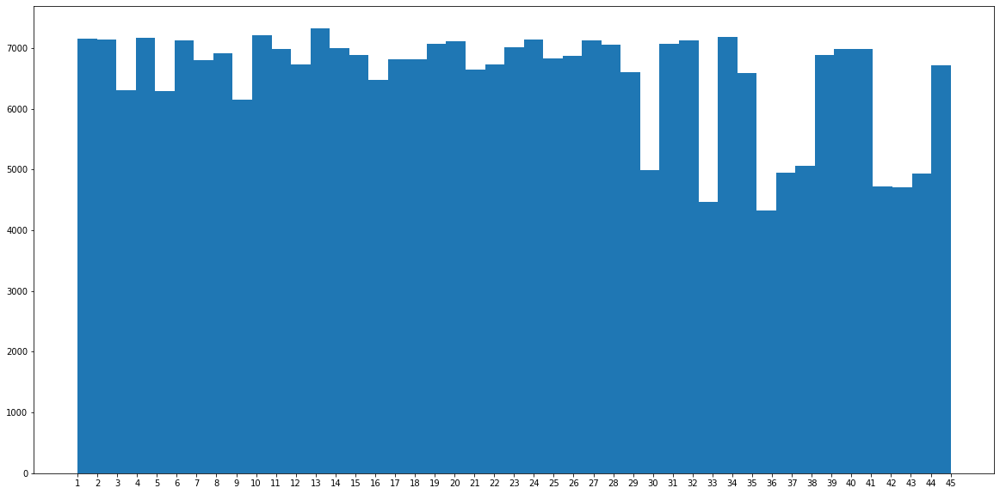

In [37]:
plt.figure(figsize=(20,10))
plt.hist(list(combined_data_train['Store']), bins = combined_data_train['Store'].nunique() )

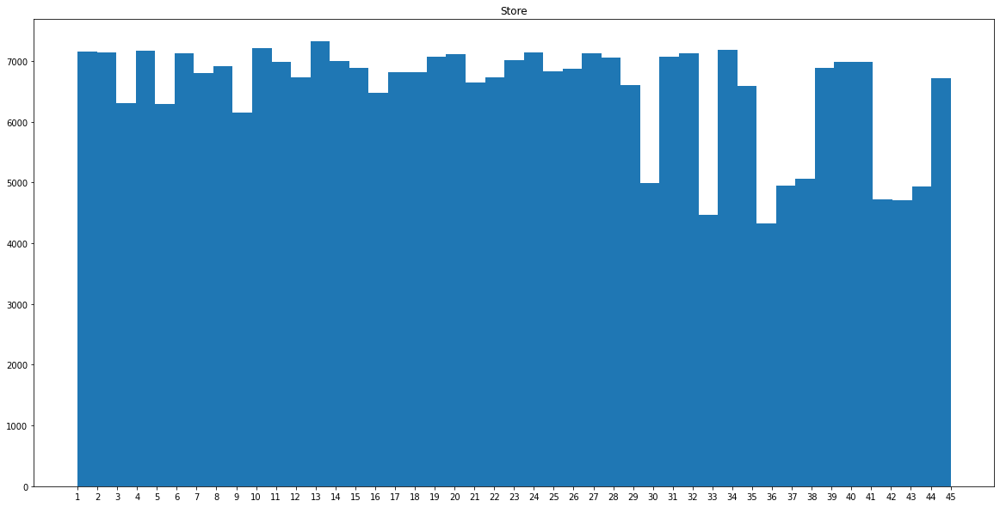

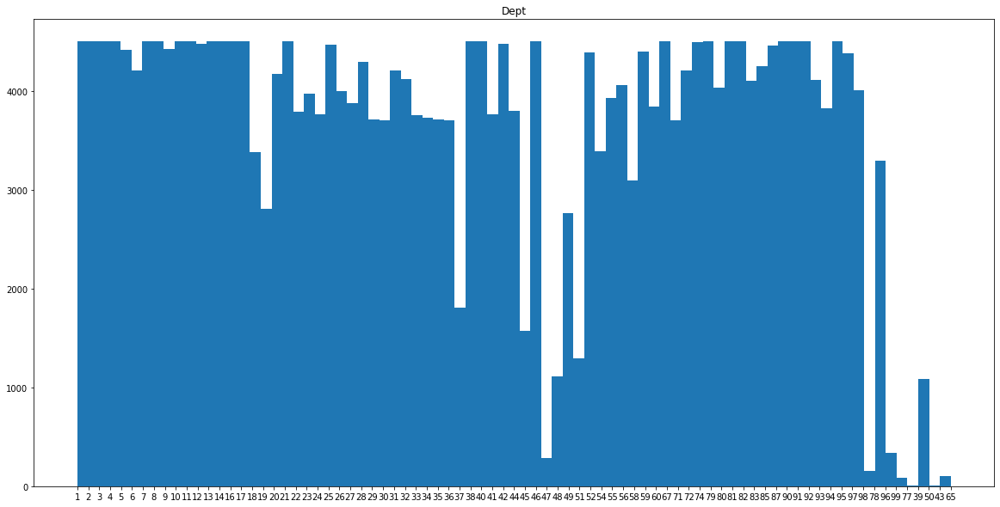

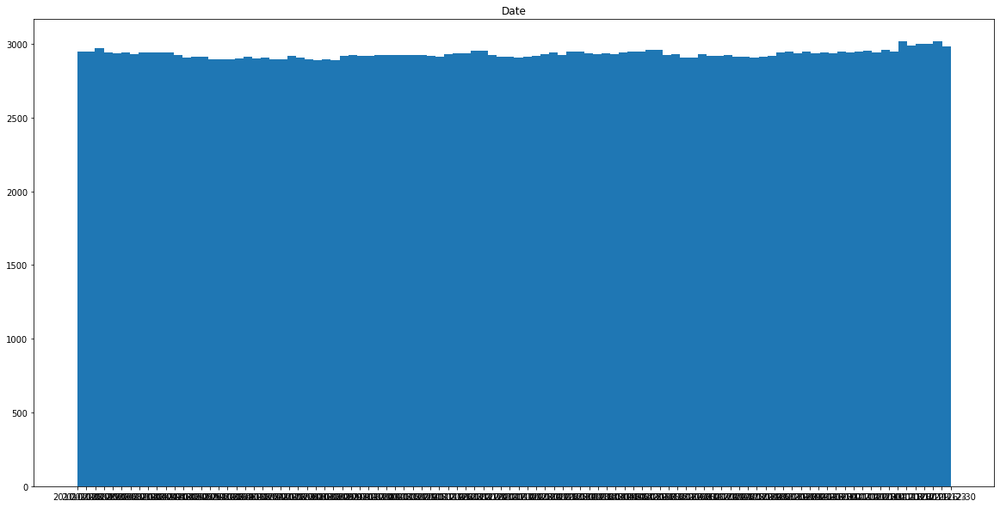

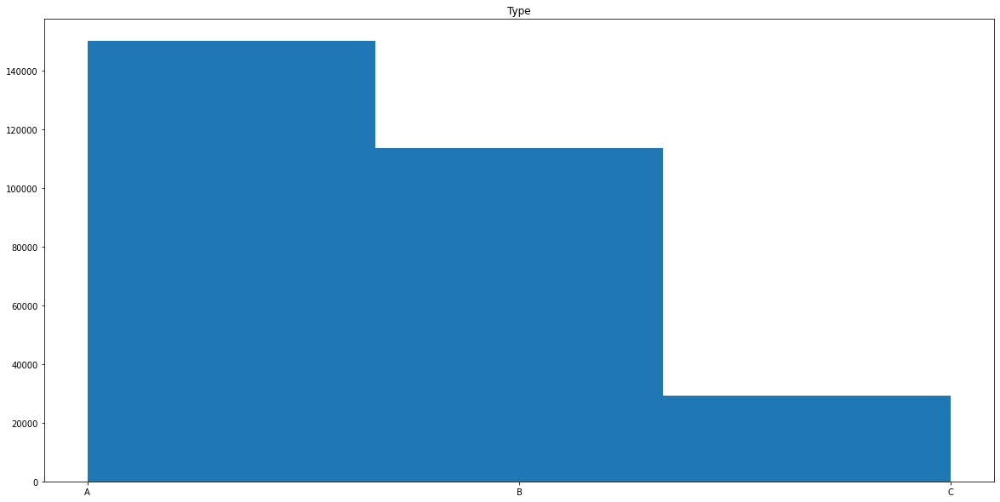

In [38]:
cat_columns = combined_data_train.select_dtypes(np.object).columns.tolist()
##univariate analysis of categorical variables
for var in cat_columns:
    plt.figure(figsize = (20,10))
    plt.hist(list(combined_data_train[var]), bins = combined_data_train[var].nunique() )
    plt.title(var)
    plt.show

In [39]:
num_columns = combined_data_train.select_dtypes(np.number).columns.tolist()
mark_columns = [x for x in num_columns if 'Mark' in x]
mark_columns
nonmark_columns = list(set(num_columns).difference(set(mark_columns)))
nonmark_columns

['Temperature',
 'Fuel_Price',
 'Unemployment',
 'IsHoliday',
 'Size',
 'CPI',
 'Weekly_Sales']

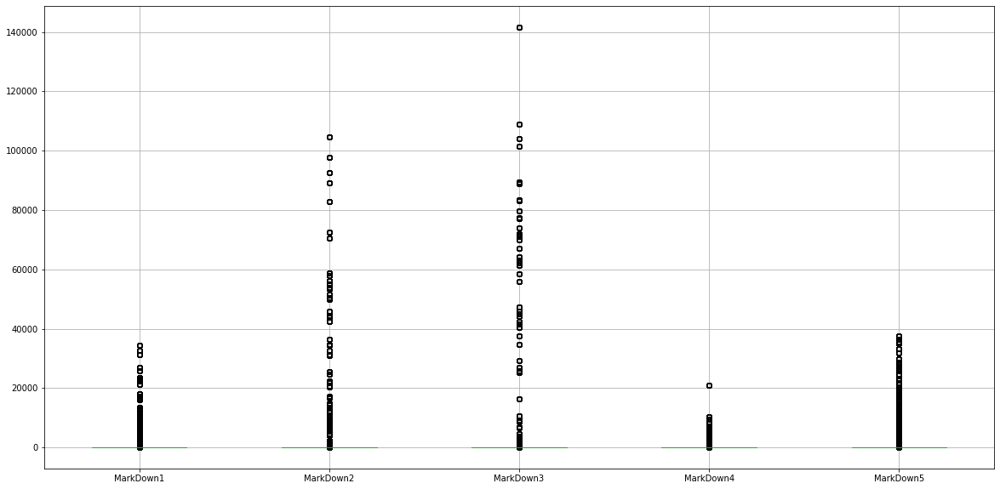

In [40]:
combined_data_train.boxplot(column = mark_columns, figsize=(20,10))

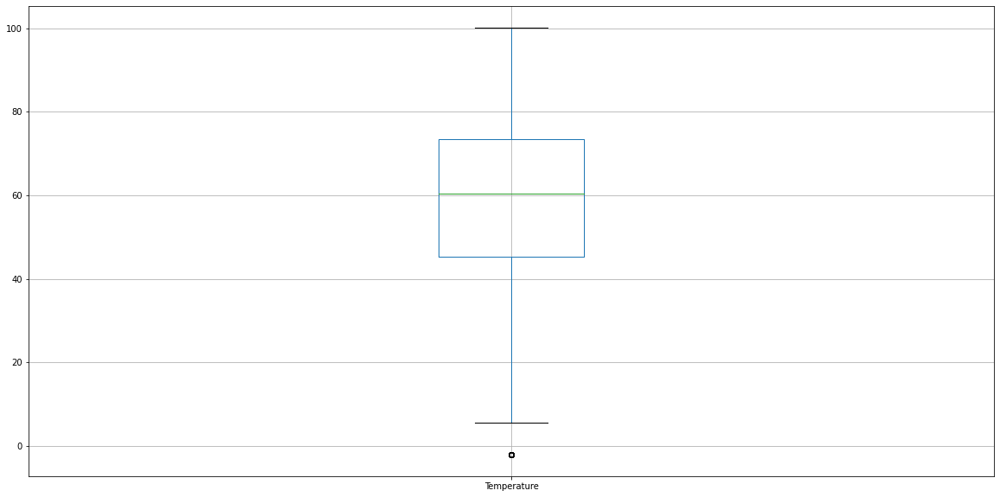

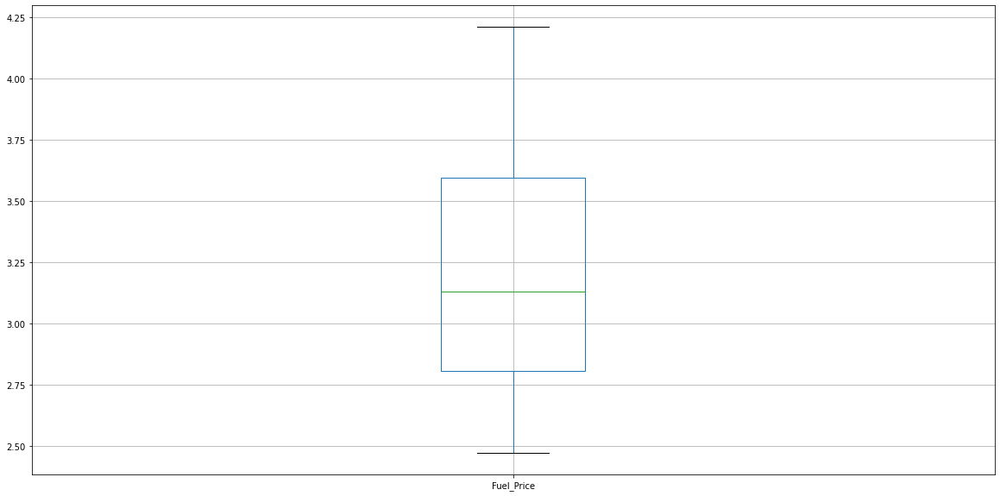

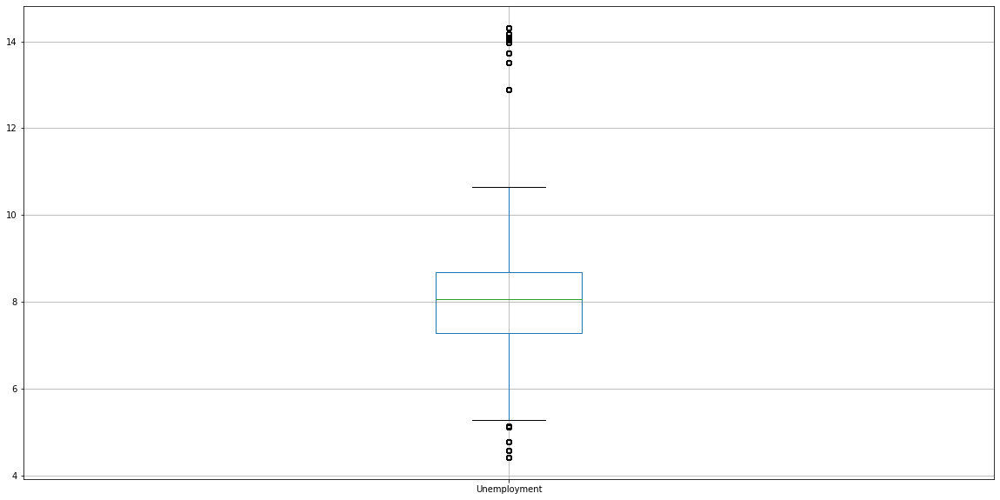

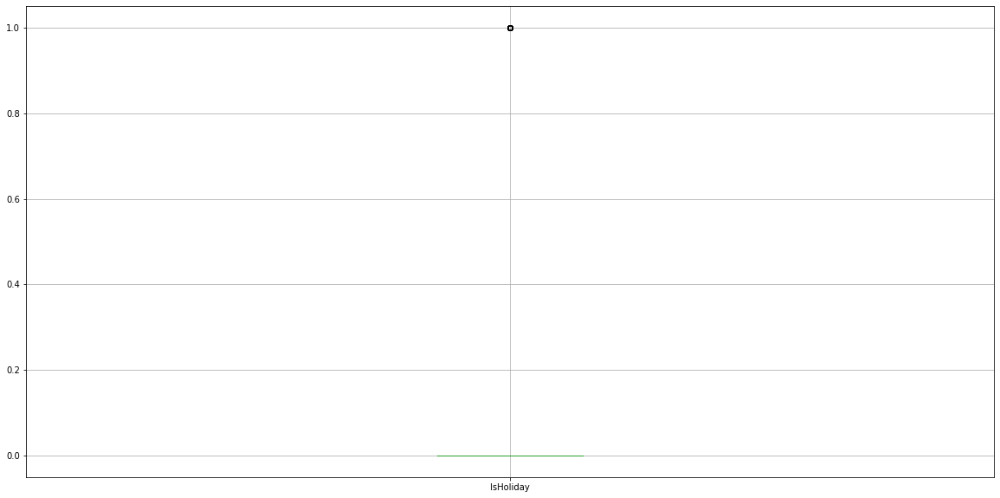

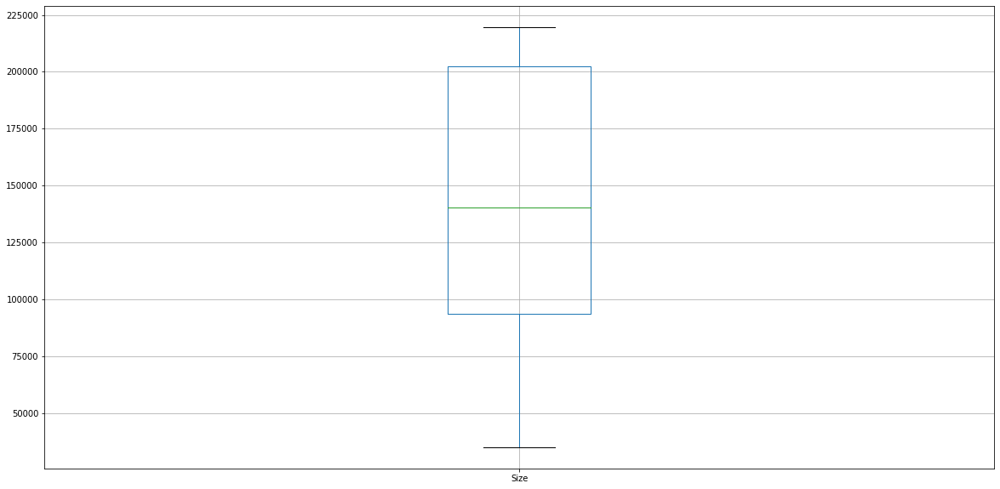

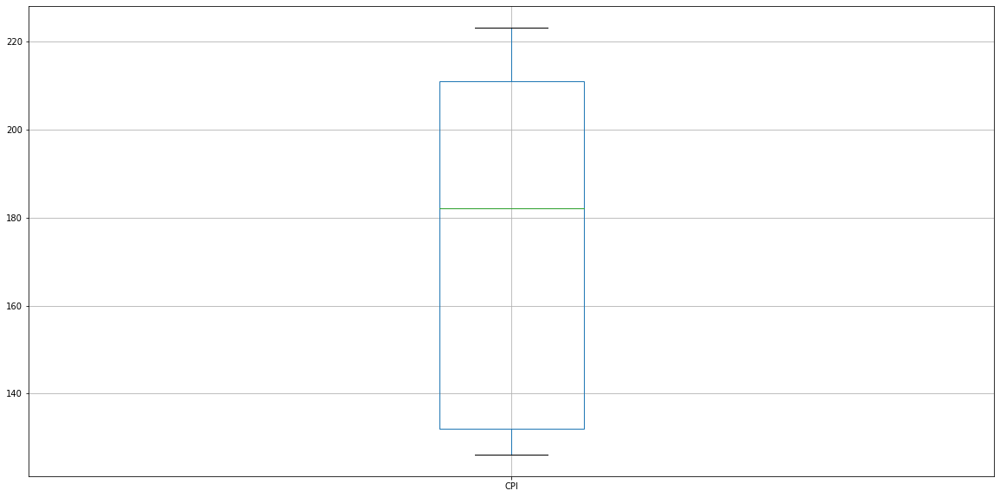

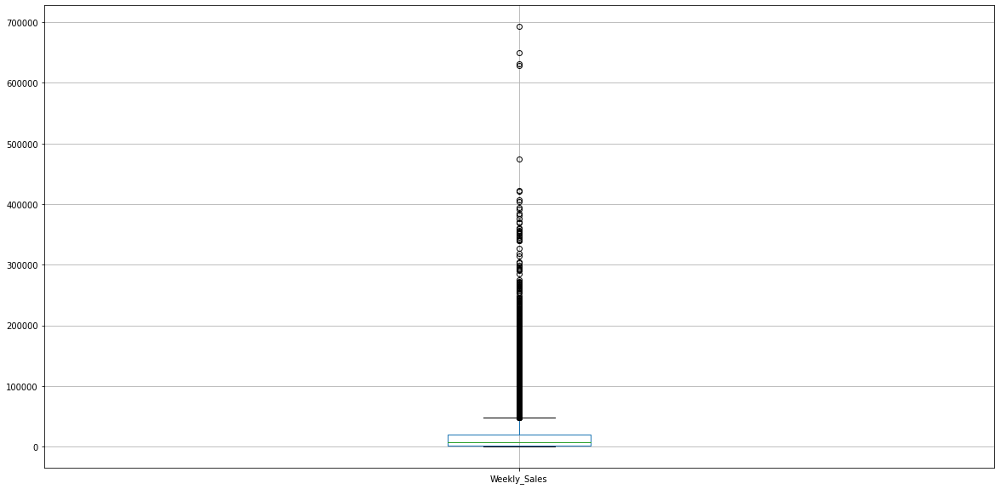

In [41]:
for var in nonmark_columns:
    combined_data_train.boxplot(column = var, figsize=(20,10))
    plt.show()

**Comments**
- Clearly the holiday and the markdowns are key for understanding the behaviour of the sales. And these are not outliers.
- In Retail, the weeks leading up to Christmas (or any other major holiday for that matter) are the most important time of the year for retailers in the United States. For example in Argentina the first holiday for retail stores is christmas and the second one, is mother's day.

### 4.2 Bivariate Analysis

In [42]:
##keeping the numeric predictors
train_num = combined_data_train[num_columns]
train_num = train_num.drop(['Weekly_Sales'], axis=1)
train_num.head()

,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Size
0,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315
1,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315
2,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315
3,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315
4,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,151315


In [43]:
##checking the highly correlated variables
corr_values = train_num.corr().unstack().reset_index()
print(corr_values.shape)
corr_values2 = corr_values[corr_values['level_0'] > corr_values['level_1'] ]
print(corr_values2.shape)
corr_values2.columns = ['var1', 'var2', 'corr_value']
corr_values2['corr_abs'] = corr_values2['corr_value'].abs()
corr_values2.sort_values( 'corr_abs', ascending=False, inplace=True)
corr_values2.head(10)

(121, 3)
(55, 3)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,var1,var2,corr_value,corr_abs
69,MarkDown4,MarkDown1,0.764146,0.764146
83,MarkDown5,MarkDown4,0.673759,0.673759
80,MarkDown5,MarkDown1,0.573937,0.573937
47,MarkDown2,MarkDown1,0.364552,0.364552
107,Unemployment,CPI,-0.298205,0.298205
55,MarkDown3,IsHoliday,0.296824,0.296824
44,MarkDown2,IsHoliday,0.272442,0.272442
70,MarkDown4,MarkDown2,0.232324,0.232324
30,Fuel_Price,CPI,-0.180454,0.180454
11,Temperature,IsHoliday,-0.178936,0.178936


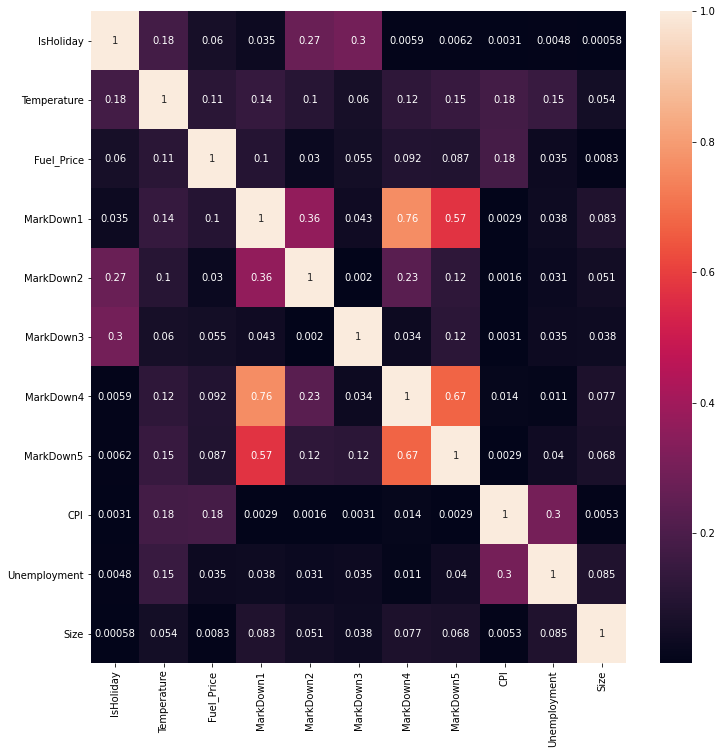

In [44]:
##creating a heat map to see the degree of correlation visually
plt.figure(figsize=(12, 12))
vg_corr = train_num.corr().abs()
sns.heatmap(vg_corr, xticklabels = vg_corr.columns.values,yticklabels = vg_corr.columns.values, annot = True)

**Comments**
- There is a significant level of correlation between Markdown 5 and 4, between 5 and 1, between 4 and 1, and a moderate level of correlation between CPI and unemployment, and between Markdown 1 and Markdown 2.

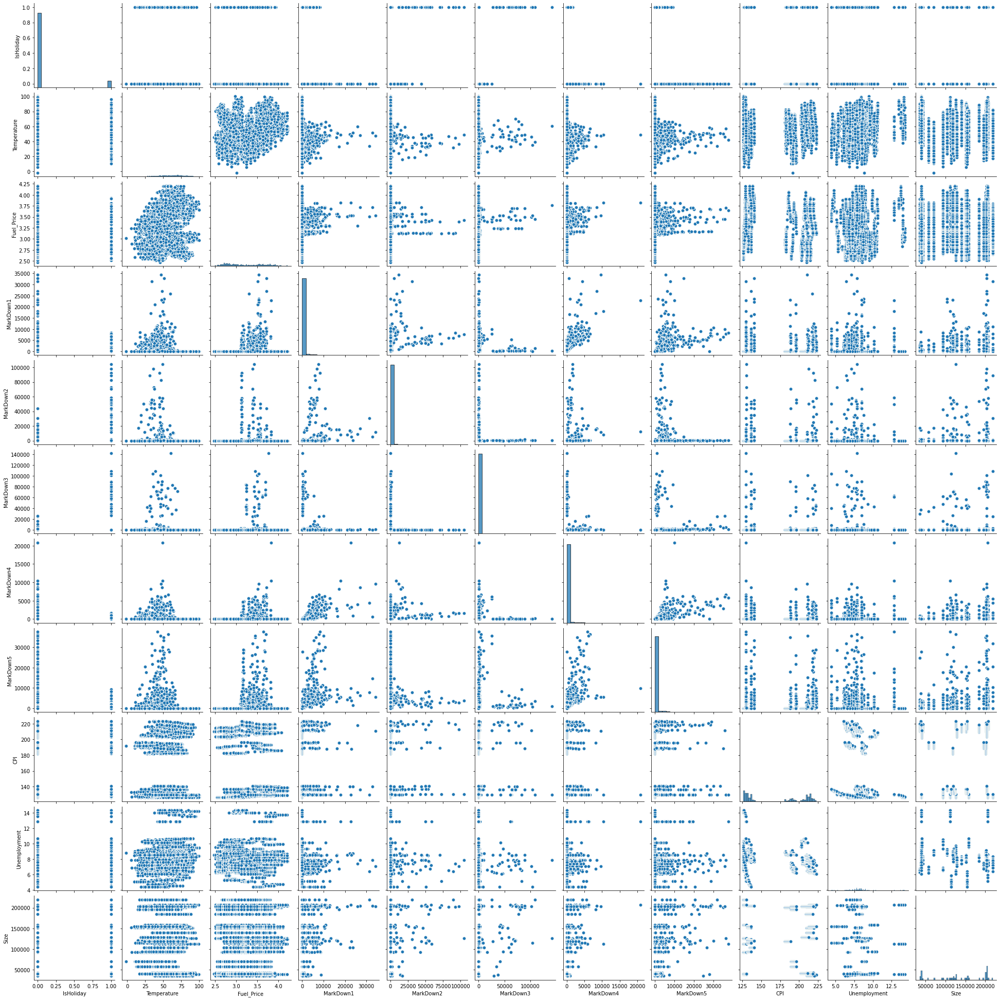

In [45]:
##plotting each numeric predictor against the other
sns.pairplot(train_num)

Store
    Store  Weekly_Sales
0       1  1.542039e+06
11      2  1.938904e+06
22      3  3.956343e+05
33      4  2.067737e+06
40      5  3.130725e+05
Dept
    Dept  Weekly_Sales
0      1  8.819285e+05
10     2  1.955582e+06
21     3  5.210935e+05
32     4  1.161434e+06
43     5  1.021350e+06


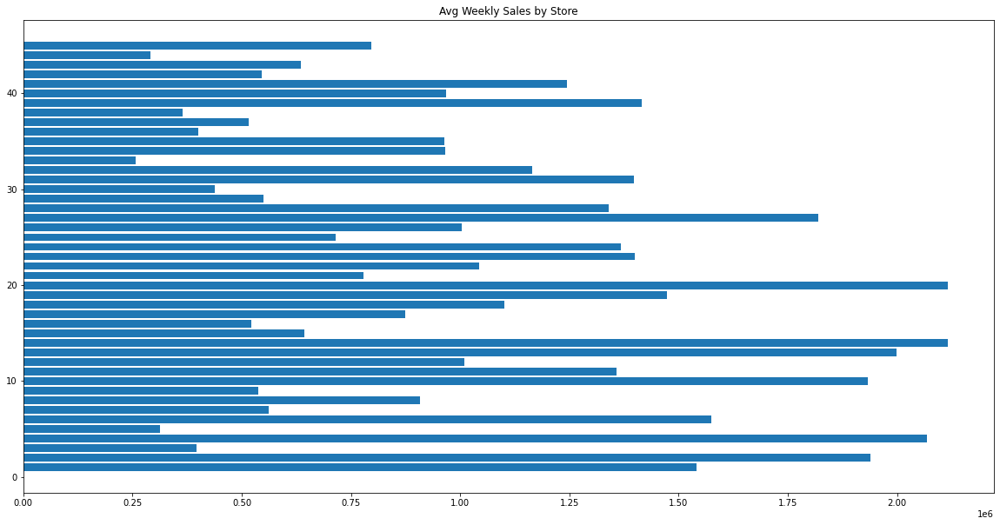

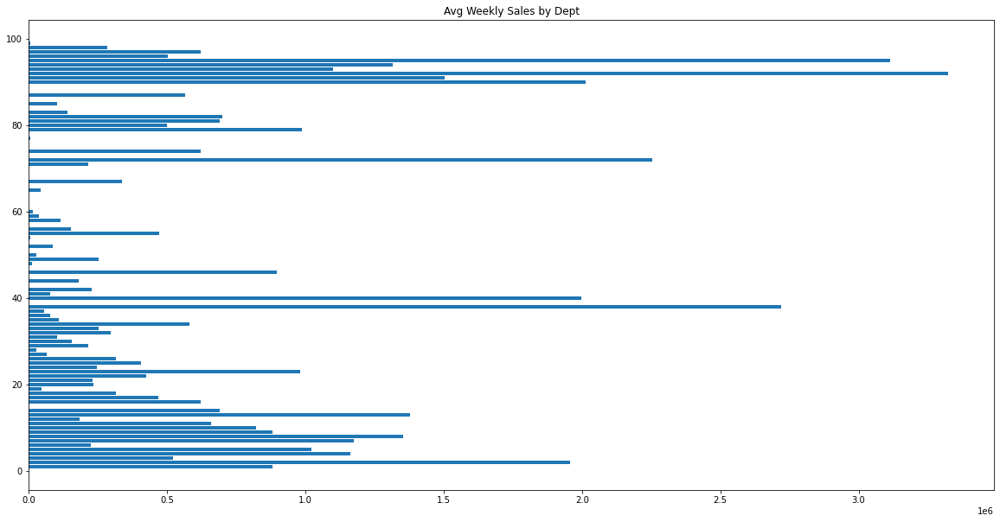

In [46]:
##looking at average weekly Sales by STORE & DEPT
for var in ['Store', 'Dept']:
    print(var)
    agg_temp = combined_data_train.groupby([var, 'Date'], as_index=False).agg({'Weekly_Sales': 'sum'})
    agg_temp2 = agg_temp.groupby([var], as_index=False).agg({'Weekly_Sales': 'mean'})
    agg_temp2[var] = pd.to_numeric(agg_temp2[var])
    agg_temp2.sort_values(var, inplace=True)
    print(agg_temp2.head())
    plt.figure(figsize=(20,10))
    plt.title('Avg Weekly Sales by ' + var)
    plt.barh(agg_temp2[var], agg_temp2['Weekly_Sales'])

**Comments**
- In terms of avg weekly sales by store, it looks like there is a lot of differences between all stores.
- The avg weekly sales by dept seems to be spread out and it looks like there are few depts that have a strong representation in the total, while others are more irrelevant.

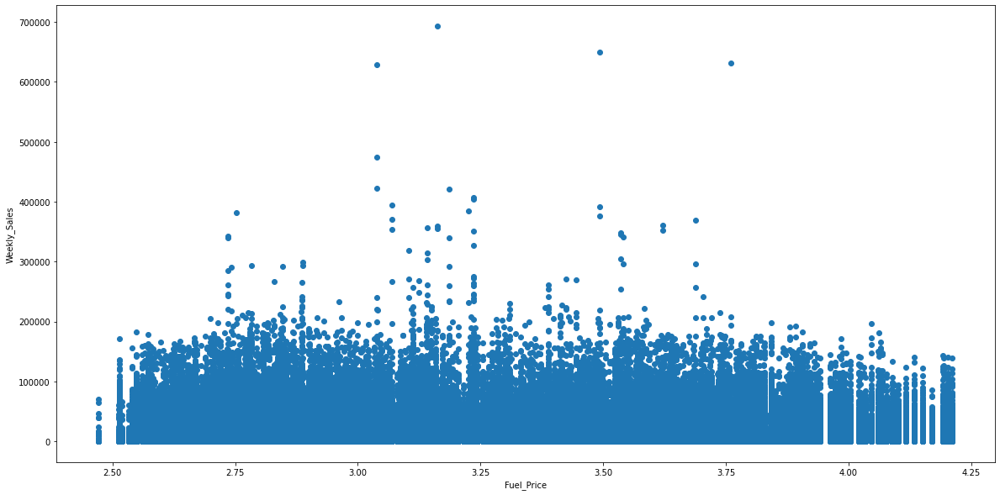

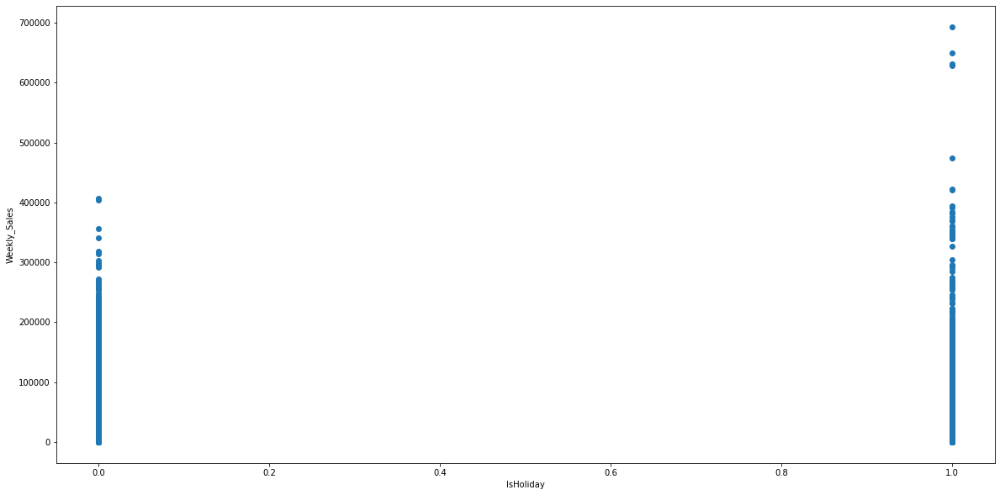

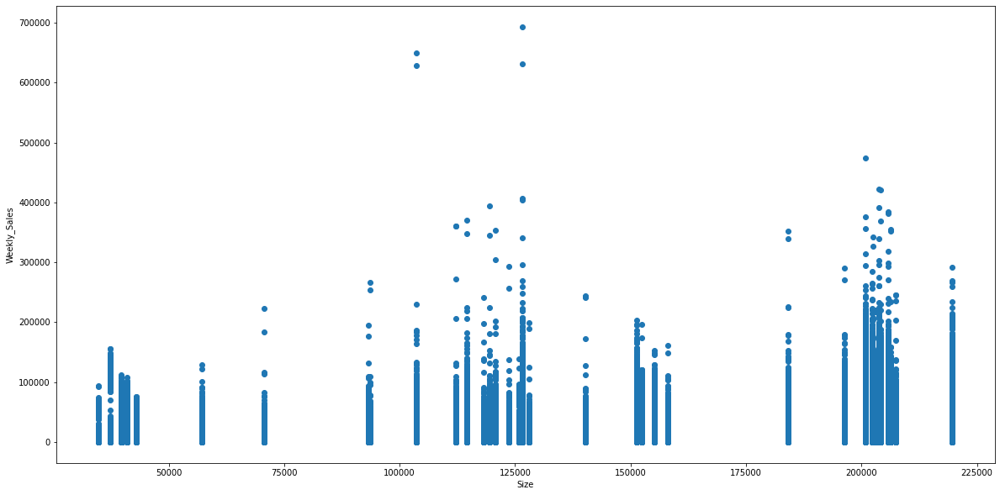

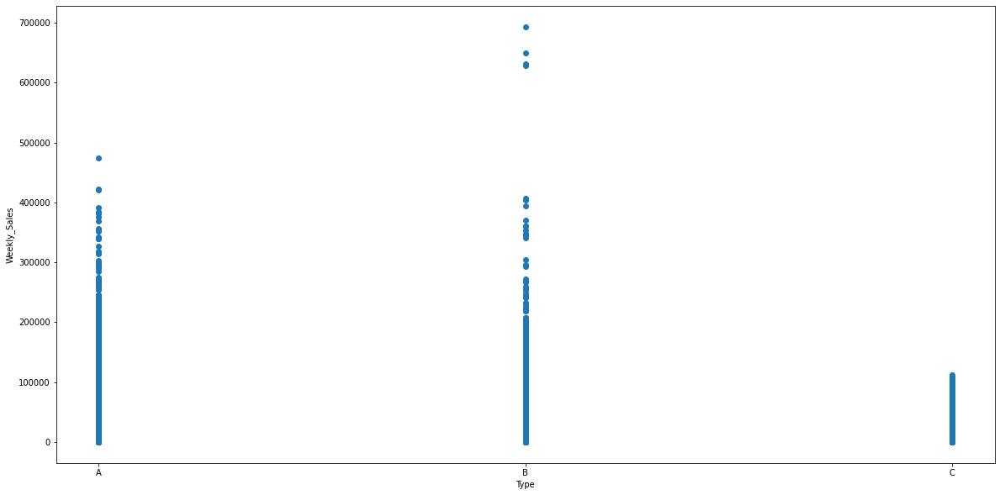

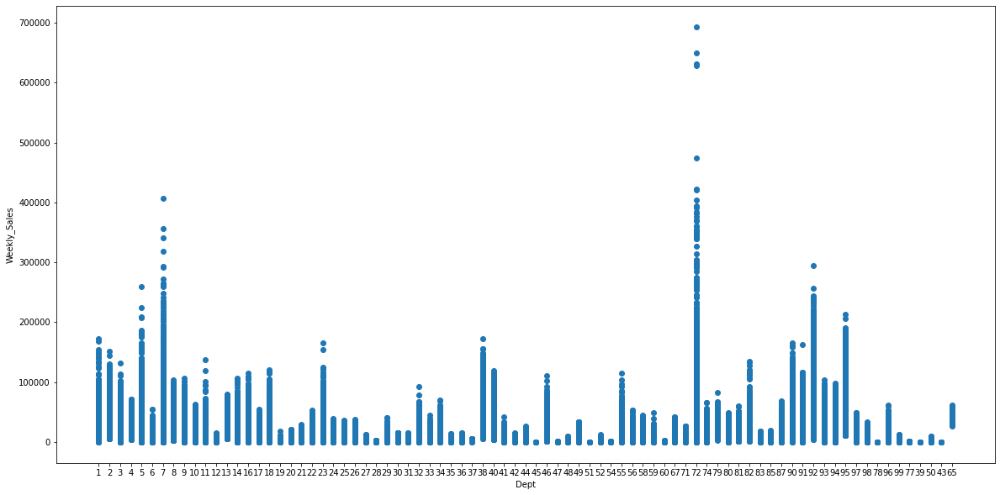

...

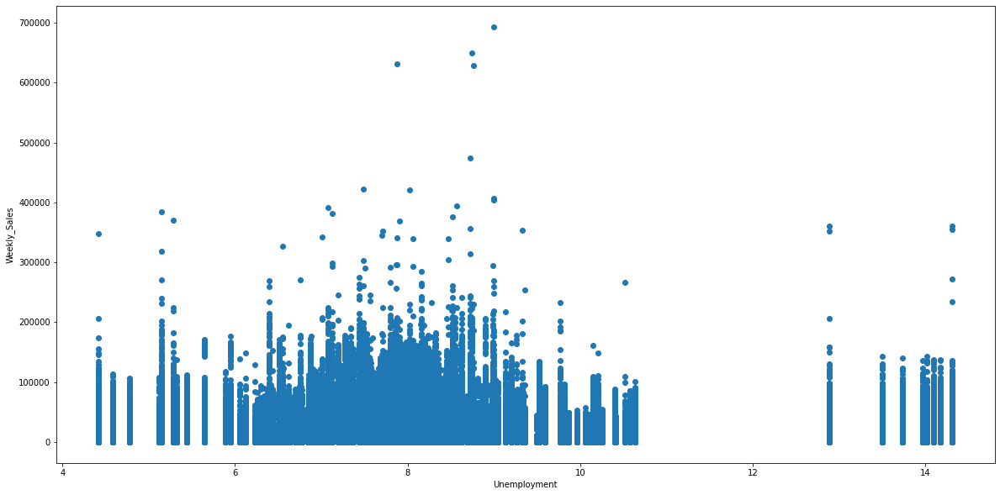

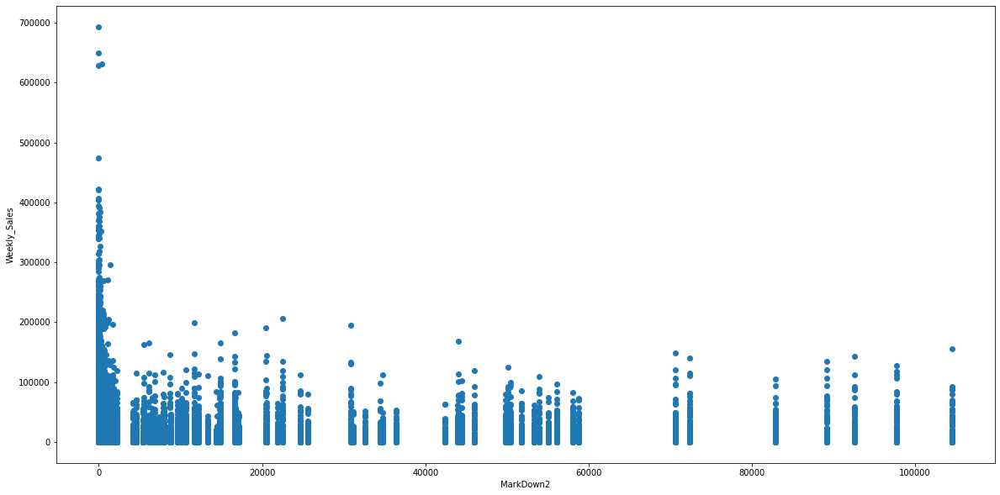

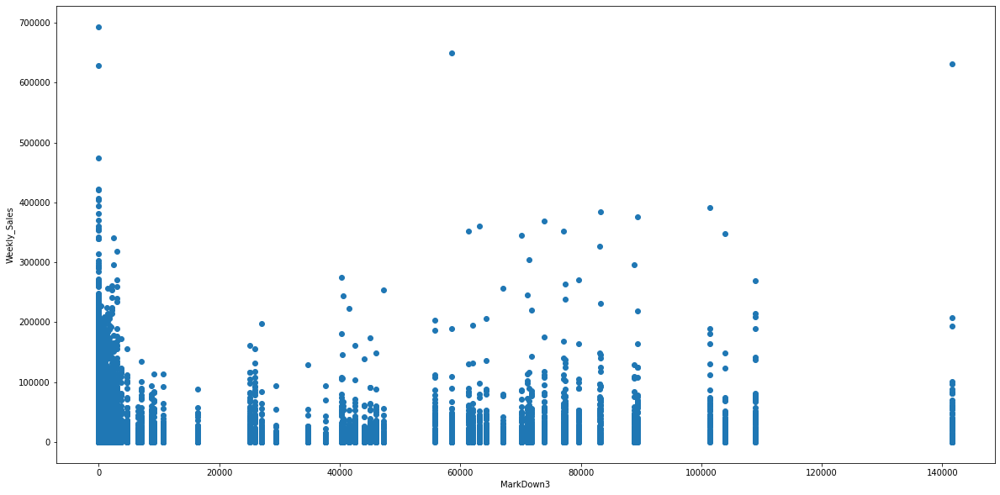

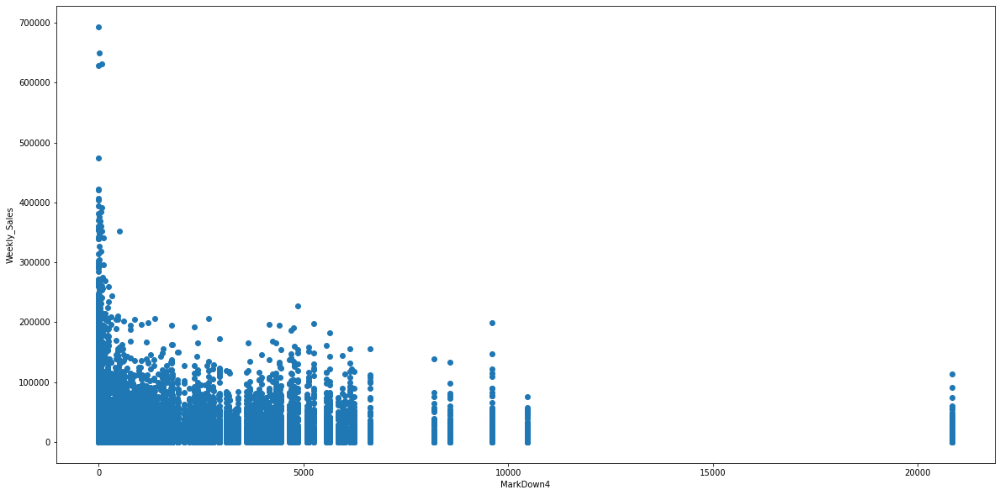

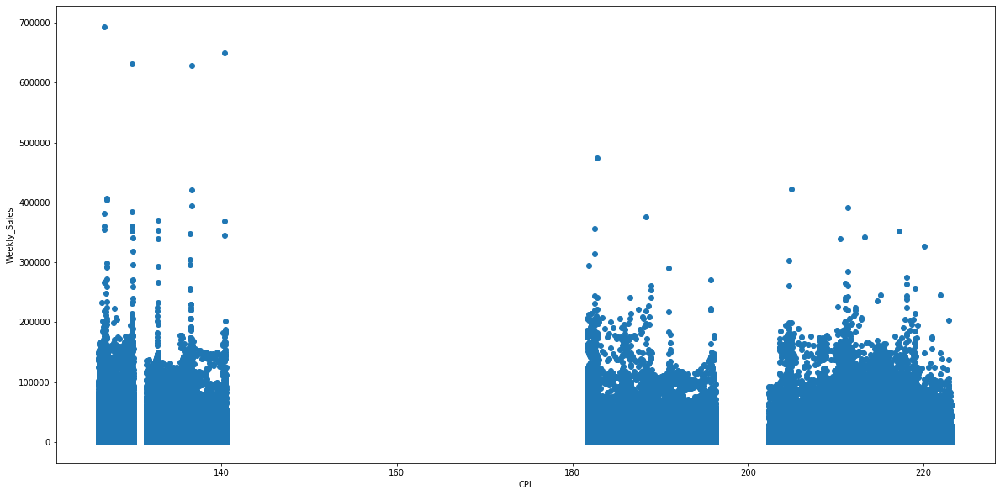

In [47]:
##scatter plot to see trend of predictors with dependent variable
var_list = [x for x in combined_data_train.columns]
columnstodrop = ['Weekly_Sales', 'Date']
var_list = list(set(var_list).difference(set(columnstodrop)))
for varname in var_list:
    plt.figure(figsize=(20,10))
    plt.scatter(combined_data_train[varname], combined_data_train['Weekly_Sales'])
    plt.xlabel(varname); plt.ylabel("Weekly_Sales")


In [48]:
##check trend of dependent variable with other variables
all_corr = combined_data_train.corr().unstack().reset_index()
print(all_corr.shape)
corr_table = all_corr[all_corr['level_1'] =='Weekly_Sales' ]
corr_table = corr_table.loc[ (corr_table['level_0'] != 'Weekly_Sales') ]
print(corr_table.shape)
corr_table.columns = ['var1', 'var2', 'corr_value']
corr_table['corr_abs'] = corr_table['corr_value'].abs()
corr_table = corr_table.sort_values(by= ['corr_abs'], ascending = False )
corr_table

(144, 3)
(11, 3)


,var1,var2,corr_value,corr_abs
132,Size,Weekly_Sales,0.242929,0.242929
72,MarkDown3,Weekly_Sales,0.044642,0.044642
96,MarkDown5,Weekly_Sales,0.038685,0.038685
48,MarkDown1,Weekly_Sales,0.035576,0.035576
84,MarkDown4,Weekly_Sales,0.031970,0.031970
120,Unemployment,Weekly_Sales,-0.025631,0.025631
108,CPI,Weekly_Sales,-0.021871,0.021871
60,MarkDown2,Weekly_Sales,0.016028,0.016028
12,IsHoliday,Weekly_Sales,0.013925,0.013925
24,Temperature,Weekly_Sales,-0.007911,0.007911


### 4.3  Date trends

In [49]:
##adding the week number and year column 
combined_data_train['week_number'] = combined_data_train['Date2'].dt.week
combined_data_train['year_number'] = combined_data_train['Date2'].dt.year

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [50]:
##checking the holiday weeks with highest total sales 
temper = combined_data_train.groupby('Date', as_index=False).agg({'Weekly_Sales':'sum'})
print(temper['Weekly_Sales'].mean())
temper = combined_data_train.groupby(['Date', 'IsHoliday', 'week_number', 'year_number'], as_index=False).agg({'Weekly_Sales':'sum'})
temper.loc[temper['IsHoliday'] == 1].sort_values(by = 'Weekly_Sales', ascending=False)

47371515.068899974


,Date,IsHoliday,week_number,year_number,Weekly_Sales
94,2011-11-25,1,47,2011,66593835.85
42,2010-11-26,1,47,2010,65821216.26
1,2010-02-12,1,6,2010,48336800.10
53,2011-02-11,1,6,2011,47336816.90
83,2011-09-09,1,36,2011,46763760.42
99,2011-12-30,1,52,2011,46044300.91
31,2010-09-10,1,36,2010,45635418.66
47,2010-12-31,1,52,2010,40434740.42


In [51]:
##checking the weeks with highest total sales
temper.sort_values(by = 'Weekly_Sales', ascending=False).head(20)

,Date,IsHoliday,week_number,year_number,Weekly_Sales
46,2010-12-24,0,51,2010,80931586.20
98,2011-12-23,0,51,2011,76999773.57
94,2011-11-25,1,47,2011,66593835.85
42,2010-11-26,1,47,2010,65821216.26
45,2010-12-17,0,50,2010,61821317.85
97,2011-12-16,0,50,2011,60086723.16
44,2010-12-10,0,49,2010,55667840.03
96,2011-12-09,0,49,2011,55561557.73
8,2010-04-02,0,13,2010,50424232.22
17,2010-06-04,0,22,2010,50188767.60


**Comments**
- It looks like the weeks prior to holidays are the most important ones in terms of sales, which is totally reasonable, but is giving us a hint regarding how to estimate sales.

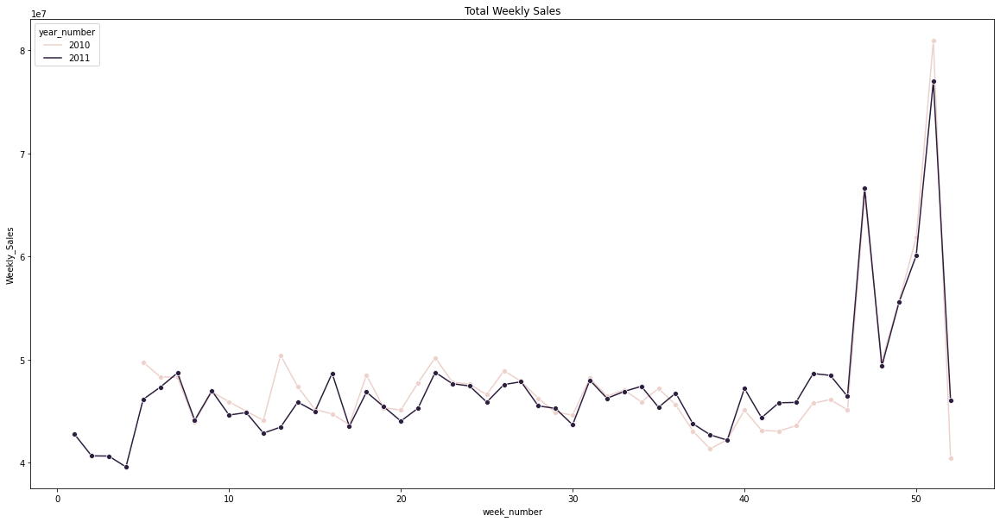

In [52]:
##checking weekly sales of different years
another_agg = combined_data_train.groupby(['week_number', 'year_number', 'IsHoliday'], as_index=False).agg({ 'Weekly_Sales' : 'sum'})
plt.figure(figsize=(20,10))
plt.title('Total Weekly Sales')
sns.lineplot(x="week_number", y="Weekly_Sales", hue="year_number", data = another_agg, marker = 'o')

**Comments**
- It's quite visible that the spike is in christmas, and the downshutting afterwards is related to the weeks that comes after christmas.
- First big conclusion is that both years have a significant simillarity in terms of behaviour.
- And why is that? Potentially because both years had a similar macroeconomic behaviour. It it were one of those 2 years that had a big crush, or maybe a recession, the curve will not be that similar.
- Second conclusion is that probably if both years are similar, macroeconomic conditions are not going to affect the projection as long as remains similar.

          Date2 Store  Weekly_Sales
2075 2010-12-24    14    3818686.45
2082 2010-12-24    20    3766687.43
2071 2010-12-24    10    3749057.69
4443 2011-12-23     4    3676388.98
2074 2010-12-24    13    3595903.20
4414 2011-12-23    13    3556766.03
4422 2011-12-23    20    3555379.47
2103 2010-12-24     4    3526713.39
4411 2011-12-23    10    3487986.89
2081 2010-12-24     2    3436154.68
          Date2 Dept  Weekly_Sales
3301 2010-11-26   72   10533640.92
7292 2011-11-25   72   10089874.40
3605 2010-12-24    7    6490778.39
3607 2010-12-24   72    6020196.03
7606 2011-12-23    7    5535941.35
7608 2011-12-23   72    5028104.79
7623 2011-12-23   92    4647997.52
7307 2011-11-25   92    4330784.59
3620 2010-12-24   92    4203774.33
7543 2011-12-16   92    4093797.82


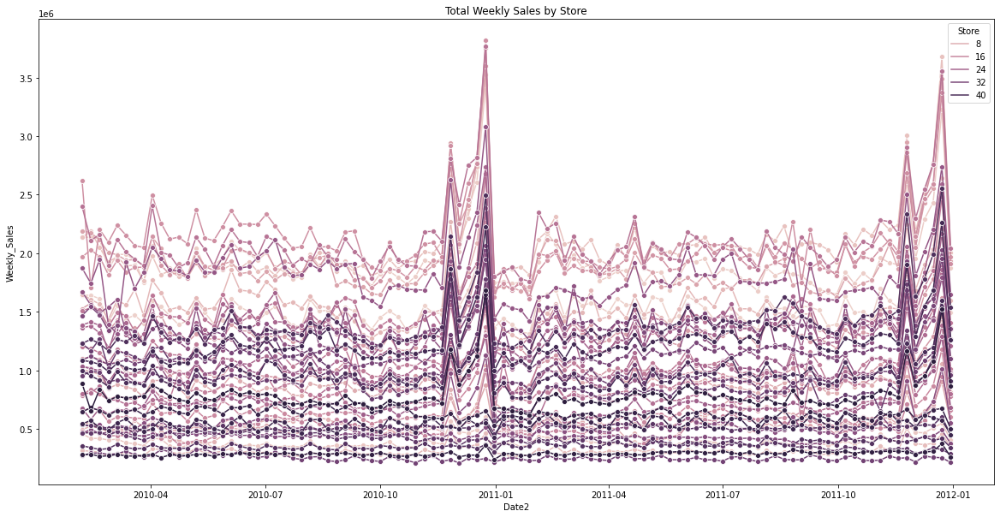

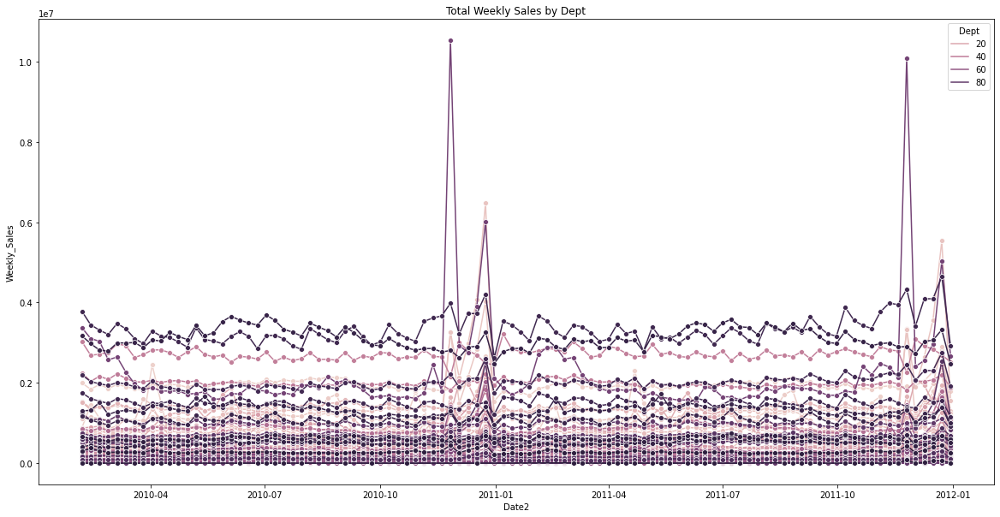

In [53]:
##checking total weekly Sales of different Stores
for var in ['Store', 'Dept']:
    agg_temp = combined_data_train.groupby(['Date2', var], as_index=False).agg({ 'Weekly_Sales' : 'sum'})
    print(agg_temp.sort_values(by='Weekly_Sales', ascending=False).head(10))
    plt.figure(figsize=(20,10))
    plt.title('Total Weekly Sales by ' + var)
    agg_temp[var] = pd.to_numeric(agg_temp[var])#The hue variable has to be numerical 
    sns.lineplot(x="Date2", y="Weekly_Sales", hue=var, data = agg_temp, marker = 'o')

(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


(100, 5)
(100, 5)
(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(7, 5)
(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(6, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(89, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


(100, 5)
(100, 5)
(98, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(9, 5)
(49, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)
(100, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

(100, 5)
(100, 5)
(100, 5)
(51, 5)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `fi

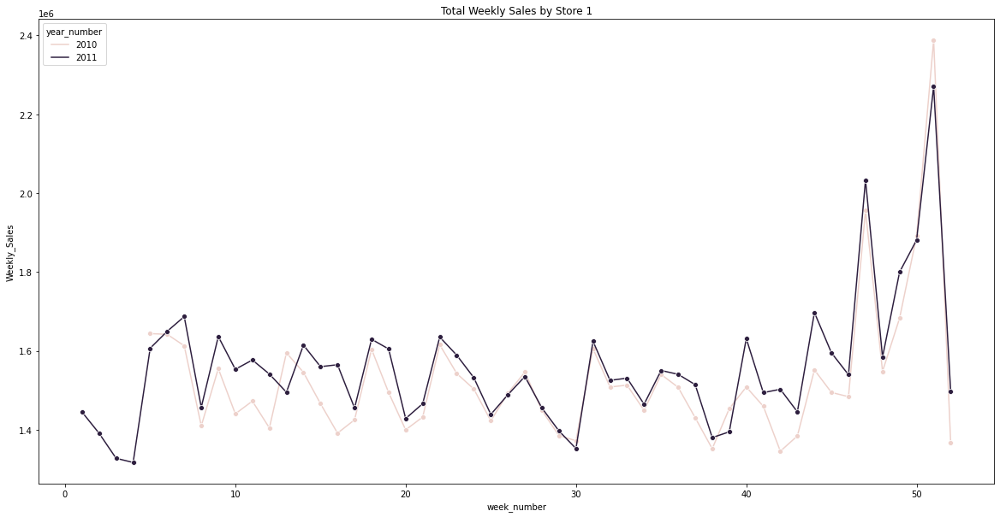

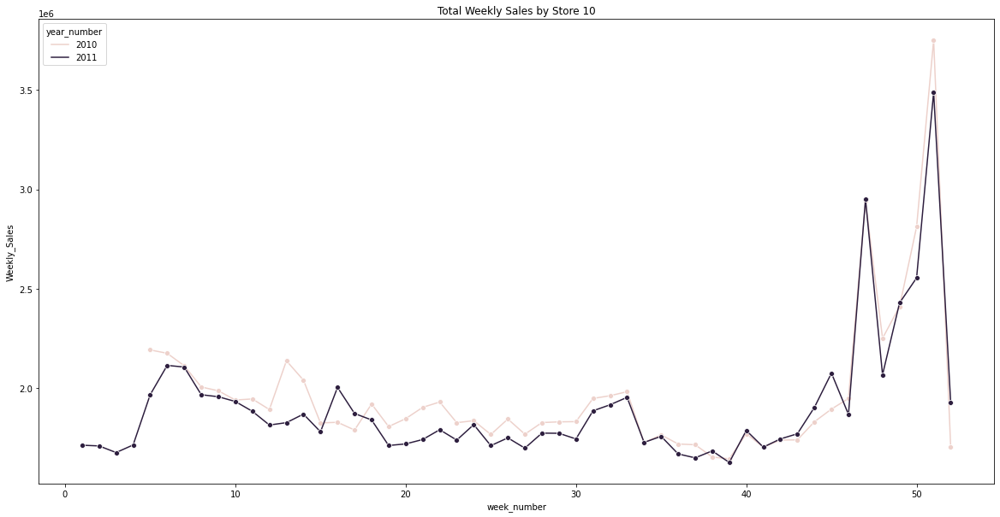

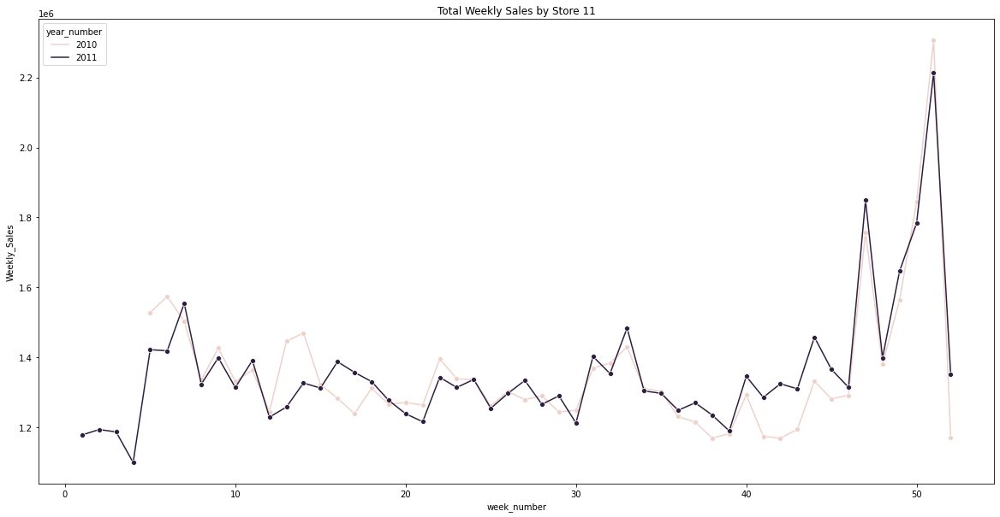

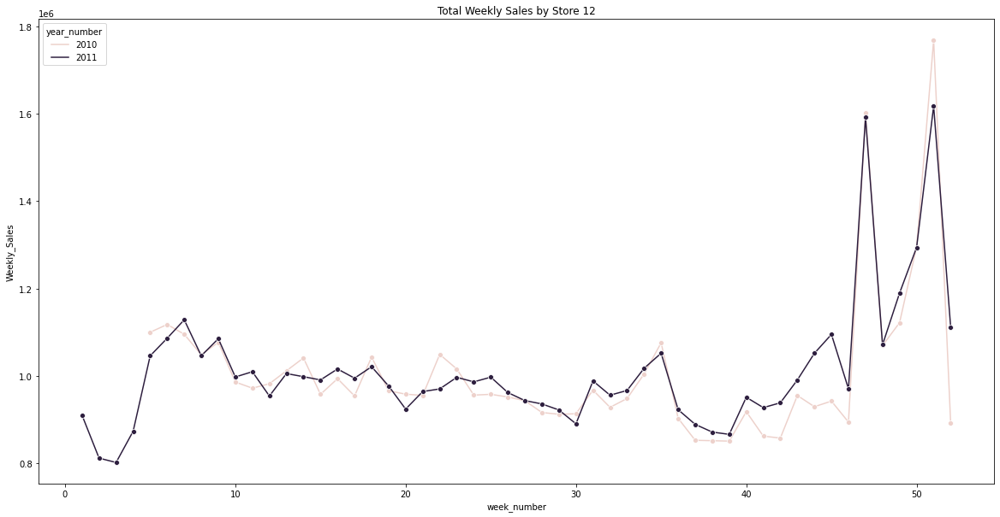

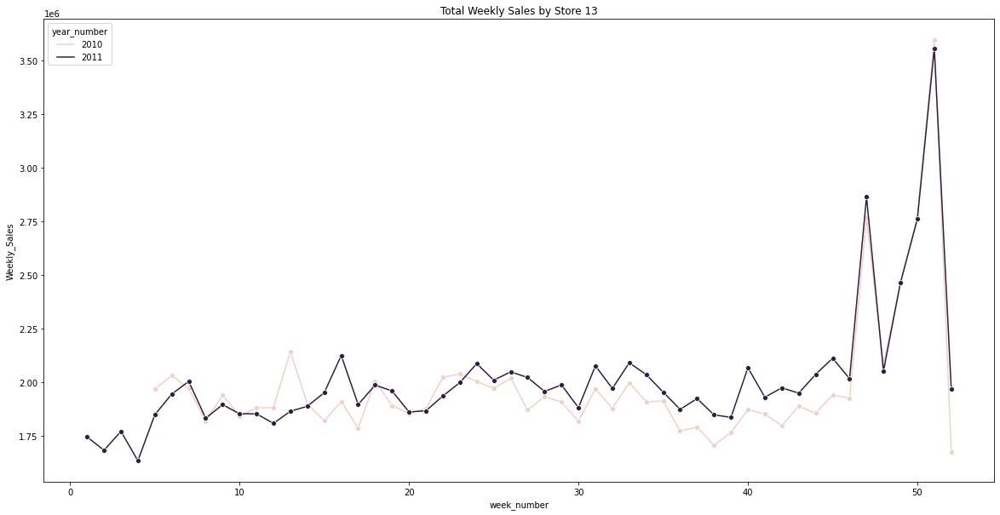

...

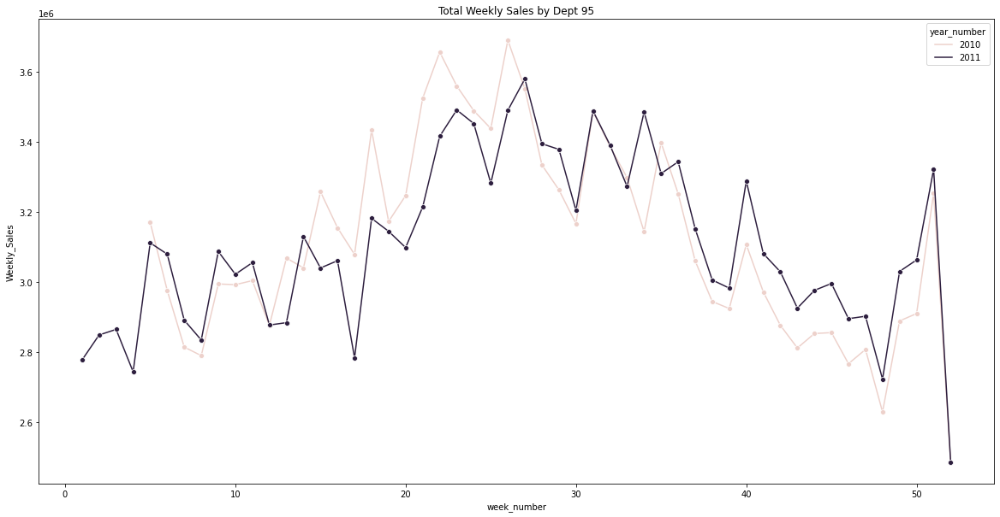

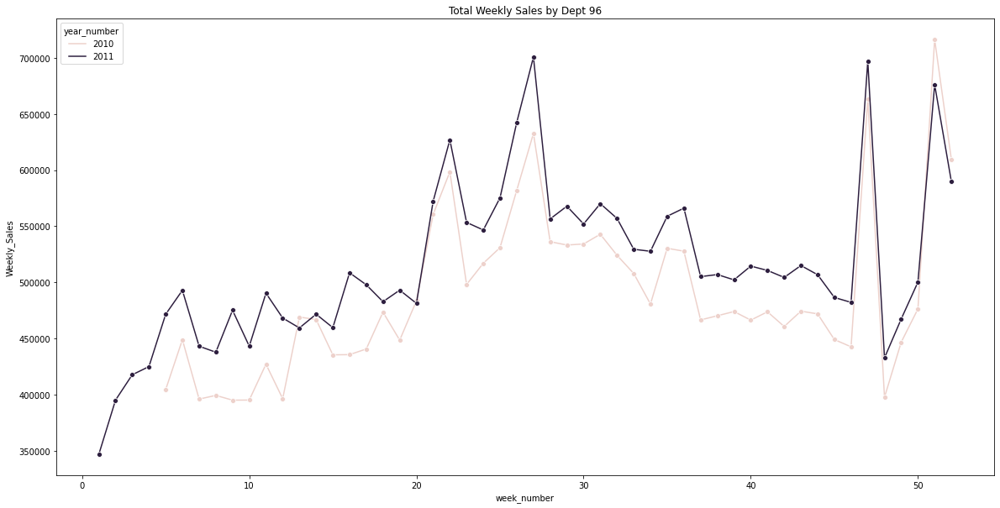

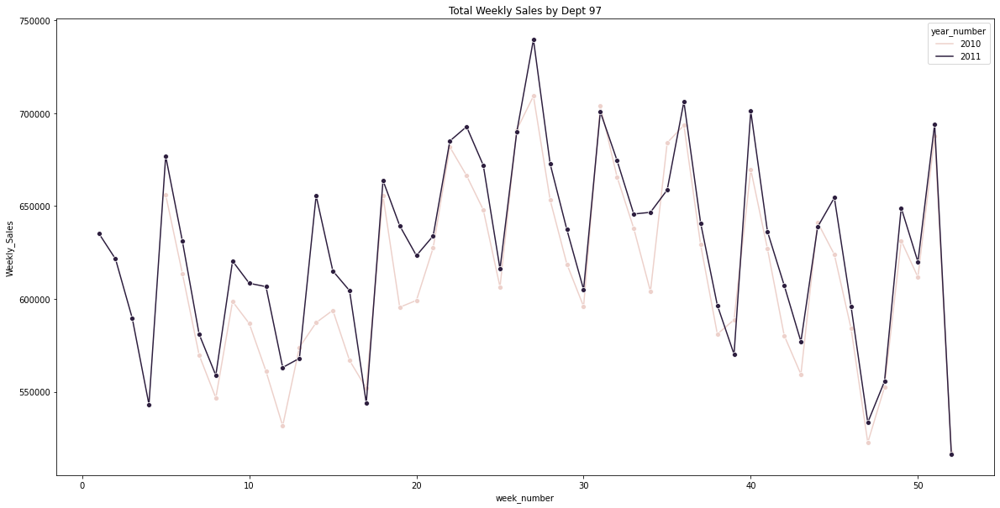

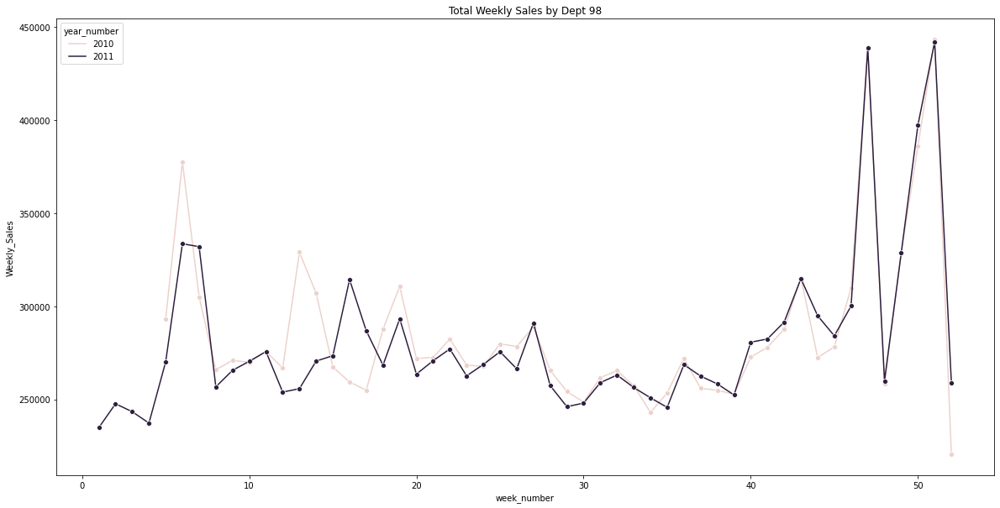

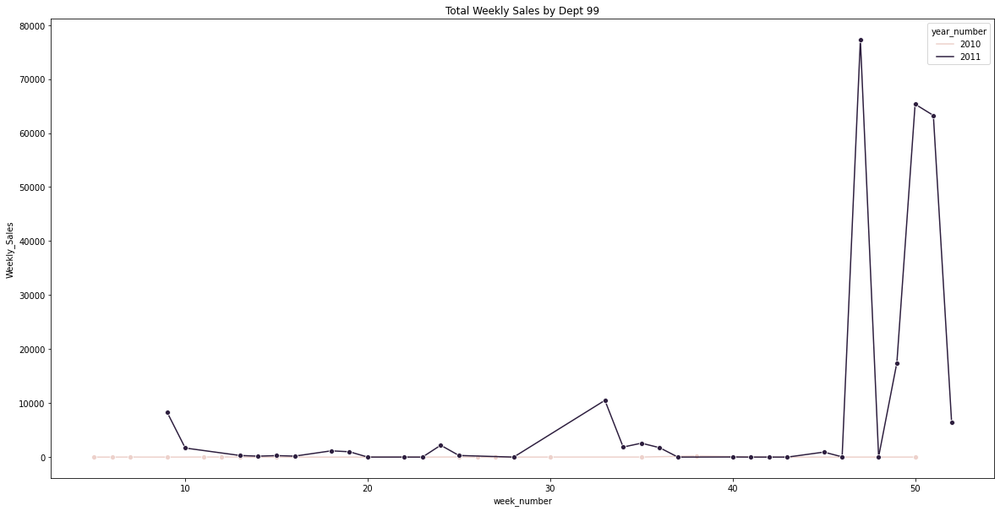

In [54]:
##checking weekly Sales of different years by Store and by Dept
for var in ['Store', 'Dept']:
    another_agg = combined_data_train.groupby([var, 'week_number', 'year_number', 'IsHoliday'], as_index=False).agg({ 'Weekly_Sales' : 'sum'})
    for idd in another_agg[var].unique() :
        temper = another_agg.loc[ another_agg[var] == idd ]
        print(temper.shape)
        plt.figure(figsize=(20,10))
        plt.title('Total Weekly Sales by ' + var + " " + idd)
        sns.lineplot(x="week_number", y="Weekly_Sales", hue="year_number", data = temper, marker = 'o')


## 5. Feature Creation

In [55]:
##marking the holiday names
conditions = [combined_data_train['IsHoliday'] == 0, combined_data_train['week_number'] == 52, combined_data_train['week_number'] == 47, \
             combined_data_train['week_number'] == 36, combined_data_train['week_number'] == 6]
choices = ['no_holiday', 'christmas', 'thanksgiving', 'labor_day', 'super_bowl']
combined_data_train['holiday_type' ] = np.select(conditions, choices, default=np.nan)
combined_data_train['holiday_type'].value_counts()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


no_holiday      269595
thanksgiving      5946
christmas         5909
super_bowl        5879
labor_day         5875
Name: holiday_type, dtype: int64

In [56]:
##function to create sales rush weeks 
def season_variables(df):
    df['week_number'] = df['Date2'].dt.week
    df['year_number'] = df['Date2'].dt.year
    conditions = [df['IsHoliday'] == 0, df['week_number'] == 52, df['week_number'] == 47, \
                 df['week_number'] == 36, df['week_number'] == 6]
    choices = ['no_holiday', 'christmas', 'thanksgiving', 'labor_day', 'super_bowl']
    df['holiday_type' ] = np.select(conditions, choices, default=np.nan)
    print(df['holiday_type'].value_counts())
    christmas_df = pd.DataFrame(df[df['holiday_type'] == 'christmas' ]['Date2'].unique())
    christmas_df.columns = ['christmas_week']
    christmas_df['minus1'] = christmas_df['christmas_week'] -  pd.to_timedelta(7, unit='d')
    christmas_df['minus2'] = christmas_df['christmas_week'] -  pd.to_timedelta(14, unit='d')
    christmas_df['minus3'] = christmas_df['christmas_week'] -  pd.to_timedelta(21, unit='d')
    #creating all the 5 binary variables
    df['christmas_week'] = np.where(df['Date2'].isin(list(christmas_df['christmas_week']) ),1,0 )
    df['christmas_minus1'] = np.where(df['Date2'].isin(list(christmas_df['minus1']) ),1,0 )
    df['christmas_minus2'] = np.where(df['Date2'].isin(list(christmas_df['minus2']) ),1,0 )
    df['christmas_minus3'] = np.where(df['Date2'].isin(list(christmas_df['minus3']) ),1,0 )
    df['thanksgiving_week'] = np.where(df['holiday_type'] == 'thanksgiving', 1, 0)
    print(df['christmas_week'].value_counts())
    print(df['christmas_minus1'].value_counts())
    print(df['christmas_minus2'].value_counts())
    print(df['christmas_minus3'].value_counts())
    print(df['thanksgiving_week'].value_counts())
    return df

In [57]:
combined_data_train = season_variables(combined_data_train)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

no_holiday      269595
thanksgiving      5946
christmas         5909
super_bowl        5879
labor_day         5875
Name: holiday_type, dtype: int64
0    287295
1      5909
Name: christmas_week, dtype: int64
0    287234
1      5970
Name: christmas_minus1, dtype: int64
0    287251
1      5953
Name: christmas_minus2, dtype: int64
0    287266
1      5938
Name: christmas_minus3, dtype: int64
0    287258
1      5946
Name: thanksgiving_week, dtype: int64


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cav

In [58]:
combined_data_test = season_variables(combined_data_test)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

no_holiday    121057
super_bowl      2994
labor_day       2957
Name: holiday_type, dtype: int64
0    127008
Name: christmas_week, dtype: int64
0    127008
Name: christmas_minus1, dtype: int64
0    127008
Name: christmas_minus2, dtype: int64
0    127008
Name: christmas_minus3, dtype: int64
0    127008
Name: thanksgiving_week, dtype: int64


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cav

In [59]:
##creating prediction based on Store and Dept
store_dept_median = combined_data_train.groupby(['Store', 'Dept'], as_index=False).agg({'Weekly_Sales' :  ['median']})
print(store_dept_median.shape)
store_dept_median.columns = ["_".join(x) for x in store_dept_median.columns.ravel()]
store_dept_median.columns = ['Store', 'Dept', 'Weekly_Sales_median']
print(store_dept_median.head())


(3292, 3)
  Store Dept  Weekly_Sales_median
0     1    1            18988.700
1     1   10            30870.720
2     1   11            23574.725
3     1   12            10607.065
4     1   13            37848.040


In [60]:
##adding the feature into train and test data
print(combined_data_train.shape)
combined_data_train2 = pd.merge(combined_data_train, store_dept_median, on=['Store', 'Dept'], how='left')
print(combined_data_train2.shape)
print(combined_data_test.shape)
combined_data_test2 = pd.merge(combined_data_test, store_dept_median, on=['Store', 'Dept'], how='left')
print(combined_data_test2.shape)

(293204, 25)
(293204, 26)
(127008, 25)
(127008, 26)


In [61]:
##filling missing values with mean
combined_data_test2['Weekly_Sales_median'].fillna(combined_data_test2['Weekly_Sales_median'].mean() , inplace=True)

## 6. Modeling

### 6.1 Direct prediction based on Store, Dept and Week

In [62]:
##prediction based on Store, Dept and Week
simple_prediction = combined_data_train.groupby(['Store', 'Dept', 'week_number'], as_index=False).agg({'Weekly_Sales' :  ['mean', 'count' ]})
print(simple_prediction.shape)
simple_prediction.columns = ["_".join(x) for x in simple_prediction.columns.ravel()]
simple_prediction = simple_prediction.drop(['Weekly_Sales_count'], axis=1)
simple_prediction.columns = ['Store', 'Dept', 'week_number', 'Sales_prediction']
simple_prediction['prediction_type'] = 1
simple_prediction.head()

(155979, 5)


,Store,Dept,week_number,Sales_prediction,prediction_type
0,1,1,1,15984.24,1
1,1,1,2,17359.70,1
2,1,1,3,17341.47,1
3,1,1,4,18461.18,1
4,1,1,5,23295.13,1


In [63]:
pd.merge(combined_data_test, simple_prediction, on = ['Store', 'Dept', 'week_number']).shape

(124366, 27)

In [64]:
##prediction based on Dept 
moresimple_prediction = combined_data_train.groupby(['Dept'], as_index=False).agg({'Weekly_Sales' :  ['mean', 'count' ]})
print(moresimple_prediction.shape)
moresimple_prediction.columns = ["_".join(x) for x in moresimple_prediction.columns.ravel()]
print(moresimple_prediction['Weekly_Sales_count'].describe())
moresimple_prediction = moresimple_prediction.drop(['Weekly_Sales_count'], axis=1)
moresimple_prediction.columns = ['Dept', 'Sales_prediction']
moresimple_prediction['prediction_type'] = 2
moresimple_prediction.head()

(81, 3)
count      81.000000
mean     3619.802469
std      1331.333180
min         6.000000
25%      3705.000000
50%      4115.000000
75%      4500.000000
max      4500.000000
Name: Weekly_Sales_count, dtype: float64


,Dept,Sales_prediction,prediction_type
0,1,19598.410840,2
1,10,18246.069967,2
2,11,14668.411385,2
3,12,4151.166962,2
4,13,30624.612680,2


**Comments**
- This is being done to provide approximation for sales in a dept irrespective of size

In [65]:
##confirming no more than one entry for this combo
def score_direct(df_to_score, pred_df1, pred_df2):
    """
    We will use the 2 set of predictions made to estimate sales on the test data 
    """
    df_to_score['week_number'] =  df_to_score['Date2'].dt.week
    df_input = df_to_score[['Store', 'Dept', 'Date2',  'week_number']]
    print(df_input.shape)
    #checking if there is only 1 entry per combination being used to predict (i.e. Store, Dept, Week Number)
    print( df_input.groupby(['Store', 'Dept', 'week_number']).size().shape )
    #Using prediction1 and separate out combinations that remain unscored
    df_scored = pd.merge(df_input, pred_df1, on= ['Store', 'Dept', 'week_number'], how='left')
    df_present = df_scored[ pd.isnull(df_scored['prediction_type']) ==False ]
    df_missed =  df_scored[ pd.isnull(df_scored['prediction_type']) ]
    df_missed = df_missed.drop(['Sales_prediction', 'prediction_type'], axis=1)
    #using prediction2 to score the unscored test data
    df_missed_scored = pd.merge(df_missed, pred_df2, on= ['Dept'], how='left')
    print(df_missed_scored['prediction_type'].isna().sum())    
    #getting the scored test data in single DF
    df_full_scored = pd.concat( [df_present, df_missed_scored ] , axis=0)
    print(df_full_scored.shape)
    print(df_full_scored['prediction_type'].value_counts() )
    return df_full_scored

In [66]:
test_full_scored = score_direct(combined_data_test, simple_prediction, moresimple_prediction)

(127008, 4)
(127008,)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


0
(127008, 6)
1.0    124366
2.0      2642
Name: prediction_type, dtype: int64


### 6.2 - Random Forest Regression

In [67]:
##one hot encondign of the categorical variables 
cat_columns = ['Type']
combined_data_train2 = pd.concat([combined_data_train2, pd.get_dummies(combined_data_train2[cat_columns], drop_first=True)], axis=1)
combined_data_test2 = pd.concat([combined_data_test2, pd.get_dummies(combined_data_test2[cat_columns], drop_first=True)], axis=1)

In [68]:
columnstodrop = ['Type' , 'Store', 'Dept', 'Date', 'Date2', 'Weekly_Sales', 'holiday_type', 'week_number', 'year_number']
X_train = combined_data_train2.drop(columnstodrop, axis = 1 )
X_test = combined_data_test2.drop(columnstodrop, axis = 1 )
print(X_train.shape)
print(X_test.shape)

(293204, 19)
(127008, 19)


In [69]:
##dropping MarkDown4 and 5 because they are over 60% correlated to other markdown variables
X_train = X_train.drop(['MarkDown4', 'MarkDown5'], axis = 1 )
X_test = X_test.drop(['MarkDown4', 'MarkDown5'], axis = 1 )

In [70]:
Y_train = combined_data_train2['Weekly_Sales']
Y_test = combined_data_test2['Weekly_Sales']
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

In [71]:
##instantiating RFR with CV grid hyper-parameter tuning
import time
aa = time.time()
rfr = RandomForestRegressor(random_state=42,  n_jobs = -1, max_depth = 5)#criterion = 'mse',
param_grid = { 
'n_estimators': [50, 100, 200]
}
CV_rfr = GridSearchCV(estimator = rfr, param_grid=param_grid, cv= 3)
CV_rfr.fit(X_train, Y_train)
rfr_best = CV_rfr.best_estimator_
print(rfr_best)
print(time.time() - aa)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=5, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=200, n_jobs=-1, oob_score=False,
                      random_state=42, verbose=0, warm_start=False)
326.5217444896698


In [72]:
def get_FI(modelname, dfname):
    importance_list = pd.DataFrame(modelname.feature_importances_, columns=['importance'])
    varnames_list = pd.DataFrame(dfname.columns.tolist(), columns=['feature'])
    feature_importance = pd.concat([varnames_list, importance_list], axis=1, join_axes=[varnames_list.index])
    feature_importance = feature_importance.sort_values(by=['importance'], ascending=False)
    feature_importance['cum_importance'] = feature_importance['importance'].cumsum()
    return feature_importance

### 6.3 ARIMA (autoregressive integrated moving average)

- A time series is a sequence where a metric is recorded over regular time intervals.
- With an ARIMA model, you can forecast a time series using the series past values.
- If you use only the previous values of the time series to predict its future values, it is called Univariate Time Series Forecasting.
- If you use predictors other than the series (a.k.a exogenous variables) to forecast it is called Multi Variate Time Series Forecasting.
- ARIMA, short for ‘Auto Regressive Integrated Moving Average’ is actually a class of models that ‘explains’ a given time series based on its own past values, that is, its own lags and the lagged forecast errors, so that equation can be used to forecast future values.
- Any ‘non-seasonal’ time series that exhibits patterns and is not a random white noise can be modeled with ARIMA models.
- ‘Auto Regressive’ in ARIMA means it is a linear regression model that uses its own lags as predictors. Linear regression models, work best when the predictors are not correlated and are independent of each other.
- Predicted Yt = Constant + Linear combination Lags of Y (upto p lags) + Linear Combination of Lagged forecast errors (upto q lags).

In [73]:
##random example
particular_data = sales_data2.loc[(sales_data2['Store'] == '13') & (sales_data2['Dept'] == '17'), \
                                          ['Date', 'Weekly_Sales']   ]
particular_data['Date'] =  pd.to_datetime(particular_data['Date'])
particular_data.index = particular_data.Date
particular_data = particular_data.drop('Date', axis=1)
particular_data.head()

,Weekly_Sales
Date,
2010-02-05,22419.66
2010-02-12,21524.01
2010-02-19,23997.80
2010-02-26,22936.01
2010-03-05,21831.50


In [74]:
particular_data_train, particular_data_test  = particular_data[particular_data.index <= split_date],  particular_data[particular_data.index > split_date]
print(particular_data_train.shape)
print(particular_data_test.shape)

(100, 1)
(43, 1)


In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(particular_data, model='multiplicative')
fig = result.plot()

**Comments**
- Let's check first if the series is stationary

In [76]:
from pandas.plotting import autocorrelation_plot

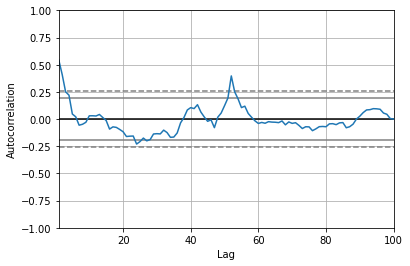

In [77]:
autocorrelation_plot(particular_data_train)

**Comments**
- Lags are above the significance line.
- We'll build the ARIMA model by determining the values of p, d and q to fit the ARIMA model. Let’s use the ARIMA() implementation in statsmodels package.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be

                             ARIMA Model Results                              
Dep. Variable:         D.Weekly_Sales   No. Observations:                   99
Model:                 ARIMA(0, 1, 0)   Log Likelihood                -959.403
Method:                           css   S.D. of innovations           3912.767
Date:                Mon, 02 Aug 2021   AIC                           1922.806
Time:                        18:38:11   BIC                           1927.996
Sample:                    02-12-2010   HQIC                          1924.906
                         - 12-30-2011                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        -18.3093    393.248     -0.047      0.963    -789.061     752.442


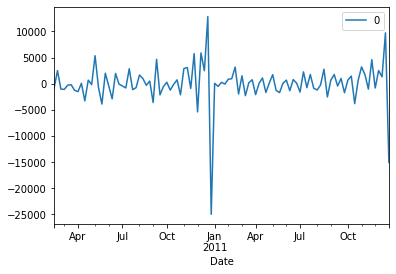

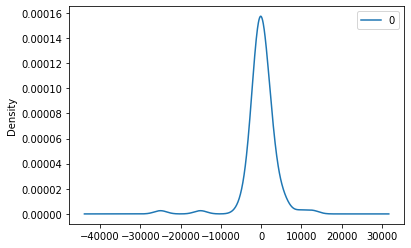

                  0
count  9.900000e+01
mean  -1.286154e-13
std    3.932679e+03
min   -2.496582e+04
25%   -1.112091e+03
50%    5.920929e+01
75%    1.480379e+03
max    1.281118e+04


In [78]:
##instantiating ARIMA
from statsmodels.tsa.arima_model import ARIMA

model = ARIMA(particular_data_train, order=(0,1,0))
model_fit = model.fit(disp=1)
print(model_fit.summary())

##plot residual errors
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
plt.show()
residuals.plot(kind='kde')
plt.show()
print(residuals.describe())

**Comments**
- Notice that the P-value is not significant.
- Also notice the residuals to ensure there are no patterns.

In [143]:
pip install pmdarima

     |████████████████████████████████| 1.5 MB 35.2 MB/s 
     |████████████████████████████████| 9.5 MB 45.5 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [79]:
##Hyper Parameter Tuning of ARIMA model with no seasonality.
from pmdarima import auto_arima
auto_model = auto_arima(particular_data_train, start_p=1, d=0, start_q=1,
                           max_p=3, max_q=3, m=1,
                           start_P=0, seasonal=False,
                           D=None, trace=True,
                           error_action='ignore'
                           )#suppress_warnings=True
auto_model.fit(particular_data_train)
print(auto_model)
test_arima = auto_model.predict(n_periods= len(particular_data_test))


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=1926.145, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2255.538, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=1944.558, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2192.542, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=1927.869, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=1928.393, Time=0.07 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=2083.681, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=1928.596, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1917.784, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1931.343, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1918.348, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1918.023, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1919.181, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : 

In [80]:
sales_data_train = combined_data_train[['Store', 'Dept', 'Date2', 'Weekly_Sales']]
sales_data_test = combined_data_test[['Store', 'Dept', 'Date2', 'Weekly_Sales']]

In [81]:
##checking the number of records for each store, dept combination
temper = sales_data_train.groupby(['Store', 'Dept'], as_index=False).agg({'Date2': 'count' })
temper = temper.rename(columns= {'Date2' : 'counter'})
temper.head()
temper2 = temper.groupby(['counter'], as_index=False).agg({'Store': 'count' })
temper2

,counter,Store
0,1,40
1,2,40
2,3,21
3,4,29
4,5,14
...,...,...
93,96,6
94,97,9
95,98,23
96,99,31


In [82]:
temper.shape

(3292, 3)

In [83]:
from sklearn.metrics import mean_absolute_error

In [84]:
def arima_modeler(df_train, df_test):
    """
    Now we will create a function to create these models after hyper-parameter tuning for all the combinations of Store and Dept
    in the data    
    """
    combos_train = df_train.groupby(['Store', 'Dept'], as_index=False).agg({'Date2' : {'min', 'max', 'count'} })
    print(combos_train.shape)
    combos_test = df_test.groupby(['Store', 'Dept'], as_index=False).agg({'Date2' :  'count' })
    combos_test = combos_test[['Store', 'Dept']]
    print(combos_test.shape)
    combos_common = pd.merge(combos_train, combos_test, on = ['Store', 'Dept'])
    print(combos_common.shape)
    combos_common.columns = ["_".join(x) for x in combos_common.columns.ravel()]
    combos_common = combos_common.rename(columns = {'Store_' : 'Store', 'Dept_' : 'Dept'})
    combos_common['total_weeks'] = (combos_common['Date2_max'] - combos_common['Date2_min']).astype('timedelta64[D]')/7 + 1
    combos_common['date_gap'] = combos_common['total_weeks'] - combos_common['Date2_count']
    combos_common_nogap = combos_common.loc[combos_common['date_gap'] ==0 ]
    print(combos_common_nogap.shape)
    combos_common_nogap = combos_common_nogap.loc[combos_common_nogap['Date2_max'] == split_date ]
    combos_common_nogap = combos_common_nogap.loc[combos_common_nogap['Date2_count'] == 100 ]
    combos_common_nogap = combos_common_nogap.sort_values(by=['Store', 'Dept'])
    combos_common_nogap.reset_index(inplace=True)
    print(combos_common_nogap.shape)
    print(combos_common_nogap.head(10))
    
    sales_data_train_nogap = pd.merge(df_train, combos_common_nogap[['Store', 'Dept']], on =  ['Store', 'Dept'] )
    print(sales_data_train_nogap.shape)
    sales_data_test_nogap = pd.merge(df_test, combos_common_nogap[['Store', 'Dept']], on =  ['Store', 'Dept'] )
    print(sales_data_test_nogap.shape)#The remaining data cant be predicted

    sales_data_train_nogap = sales_data_train_nogap.sort_values(by=['Store', 'Dept', 'Date2'])
    sales_data_test_nogap = sales_data_test_nogap.sort_values(by=['Store', 'Dept', 'Date2'])
#     sales_data_test_nogap = sales_data_test_nogap[0:10000]
    
    #creating a DF that will store all the model outputs
    all_scores = pd.DataFrame(columns = ['score'])

    for i in range(len(combos_common_nogap)):#
        print(i)
        store_id = combos_common_nogap.loc[i]['Store']
        dept_id = combos_common_nogap.loc[i]['Dept']    
        print("Now the model for Store " + store_id + " and Dept " + dept_id + " will be created")
        particular_data_train = sales_data_train_nogap.loc[(sales_data_train_nogap['Store'] == store_id) & (sales_data_train_nogap['Dept'] == dept_id), \
                                              ['Date2', 'Weekly_Sales']   ]
        print(particular_data_train.shape)
        particular_data_test = sales_data_test_nogap.loc[(sales_data_test_nogap['Store'] == store_id) & (sales_data_test_nogap['Dept'] == dept_id), \
                                                  ['Date2', 'Weekly_Sales']   ]#, 'Weekly_Sales'
        print(particular_data_test.shape)
        #The date is required as index for ARIMA models
        particular_data_train.index = particular_data_train.Date2
        particular_data_test.index = particular_data_test.Date2

        particular_data_train = particular_data_train.drop('Date2', axis=1)
        particular_data_test = particular_data_test.drop('Date2', axis=1)
        
        #Hyper Parameter tuning
        auto_model = auto_arima(particular_data_train, start_p=1, d=0, start_q=1,max_p=3, max_q=3, start_P=0, trace=True)
        auto_model.fit(particular_data_train)
        print(auto_model)
        test_arima = auto_model.predict(n_periods=len(particular_data_test))
        test_arima_df  = pd.DataFrame(test_arima, columns = ['score'] )
        #appending the new scores along with the scores already obtained
        all_scores = pd.concat([all_scores, test_arima_df], axis=0)
        all_scores = all_scores.reset_index()
        all_scores = all_scores.drop(['index'], axis=1)
        print(mean_absolute_error(particular_data_test, test_arima))
    
    #getting the model scores and actuals in one file for comparison
    sales_data_test2 = sales_data_test_nogap.reset_index()
    sales_data_test2 = sales_data_test2.drop(['index'], axis=1)
    print(sales_data_test2.head())
    test_data_scored = pd.concat([sales_data_test2, all_scores], axis=1)
    return test_data_scored

In [85]:
partialtest_scored_arima = arima_modeler(sales_data_train, sales_data_test)

(3292, 5)
(3196, 2)
(3165, 5)
(2704, 7)
(2654, 8)
   index Store Dept  Date2_count  Date2_min  Date2_max  total_weeks  date_gap
0      0     1    1          100 2010-02-05 2011-12-30        100.0       0.0
1      1     1   10          100 2010-02-05 2011-12-30        100.0       0.0
2      2     1   11          100 2010-02-05 2011-12-30        100.0       0.0
3      3     1   12          100 2010-02-05 2011-12-30        100.0       0.0
4      4     1   13          100 2010-02-05 2011-12-30        100.0       0.0
5      5     1   14          100 2010-02-05 2011-12-30        100.0       0.0
6      6     1   16          100 2010-02-05 2011-12-30        100.0       0.0
7      7     1   17          100 2010-02-05 2011-12-30        100.0       0.0
8      9     1   19          100 2010-02-05 2011-12-30        100.0       0.0
9     10     1    2          100 2010-02-05 2011-12-30        100.0       0.0
(265400, 4)


/usr/local/lib/python3.7/dist-packages/pandas/core/reshape/merge.py:643: UserWarning: merging between different levels can give an unintended result (2 levels on the left,1 on the right)
  warnings.warn(msg, UserWarning)


Se truncaron las últimas líneas 5000 del resultado de transmisión.
392.73939188616265
2404
Now the model for Store 5 and Dept 92 will be created
(100, 2)
(43, 2)
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=1616.689, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1696.171, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1616.666, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1652.800, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2070.720, Time=0.01 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=1615.833, Time=0.04 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=1617.577, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1617.759, Time=0.16 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1619.653, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.07 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 0.694 seconds
 ARIMA(2,0,0)(0,0,0)[0] intercept
962.8595768023102
2405
Now th

In [87]:
partialtest_scored_arima.shape

(114020, 5)

In [88]:
sales_data_test_arima = pd.merge(sales_data_test, partialtest_scored_arima.drop(['Weekly_Sales'], axis=1), on=['Store', 'Dept', 'Date2'], how='left' )
sales_data_test_arima.isna().sum()

Store               0
Dept                0
Date2               0
Weekly_Sales        0
score           12988
dtype: int64

In [89]:
##predicting for cases where ARIMA couldnt make the prediction due to lack of data  
sales_data_test_missing =sales_data_test_arima.loc[pd.isnull(sales_data_test_arima['score']) ]
sales_data_test_mp = pd.merge(sales_data_test_missing.drop('score', axis=1) , moresimple_prediction.rename(columns = {'Sales_prediction':'score'}) , on='Dept' )
sales_data_test_mp.head()

,Store,Dept,Date2,Weekly_Sales,score,prediction_type
0,1,18,2012-01-06,7018.32,9317.080835,2
1,1,18,2012-01-13,1700.85,9317.080835,2
2,1,18,2012-01-20,1468.65,9317.080835,2
3,1,18,2012-01-27,1842.47,9317.080835,2
4,1,18,2012-02-03,3558.71,9317.080835,2


In [90]:
sales_data_test_mp.drop('prediction_type', axis=1, inplace=True)
fullyscored_test_arima = pd.concat([partialtest_scored_arima, sales_data_test_mp ], axis=0)
fullyscored_test_arima.shape

(127008, 5)

## 7. Model Comparison

In [97]:
##getting the sales numbers in the data
test_scored_stats = pd.merge(test_full_scored, sales_data_test, on = ['Store', 'Dept', 'Date2'])
test_scored_stats.shape

(127008, 7)

In [98]:
def rf_scorer(X_df, Y_df, model_name):
    """
    obtain the prediction and compare with the actual
    """
    scored_rf = pd.DataFrame({ 'Sales_prediction' : model_name.predict(X_df)} ) 
    scored_actuals_rf = pd.concat( [scored_rf, Y_df.reset_index() ] , axis=1)
    scored_actuals_rf = scored_actuals_rf.drop(['index'], axis = 1)
    scored_actuals_rf['error_abs_rf'] = (scored_actuals_rf['Sales_prediction'] - scored_actuals_rf['Weekly_Sales']).abs()
    print(scored_actuals_rf['error_abs_rf'].describe())
    return scored_actuals_rf

In [99]:
##absolute error metric in each dataframe
test_scored_stats['error_abs_st'] = (test_scored_stats['Weekly_Sales'] - test_scored_stats['Sales_prediction']).abs()
test_rf = rf_scorer(X_test, Y_test, rfr_best)
fullyscored_test_arima['error_abs_ar'] = (fullyscored_test_arima['Weekly_Sales'] - fullyscored_test_arima['score']).abs()

count    127008.000000
mean       2615.606296
std        4475.372598
min           0.006828
25%         361.662981
50%        1179.496119
75%        2955.842488
max      136025.266490
Name: error_abs_rf, dtype: float64


In [100]:
##Mean Absolute Error
from sklearn.metrics import mean_squared_error
import math
print( "MAE Prediction Stats =   " + str((mean_absolute_error(test_scored_stats['Weekly_Sales'],  test_scored_stats['Sales_prediction'])) ) )  
print( "MAE Prediction Random Forest =   " + str((mean_absolute_error(test_rf['Weekly_Sales'],  test_rf['Sales_prediction'])) )  )
print( "MAE Prediction ARIMA  = " + str((mean_absolute_error(fullyscored_test_arima['Weekly_Sales'],  fullyscored_test_arima['score'])) )  )

MAE Prediction Stats =   2027.798292694633
MAE Prediction Random Forest =   2615.606295674436
MAE Prediction ARIMA  = 3308.0342628631274


In [101]:
##RMSE
from sklearn.metrics import mean_squared_error
import math
print( "RMSE Prediction Stats =   " + str(math.sqrt(mean_squared_error(test_scored_stats['Weekly_Sales'],  test_scored_stats['Sales_prediction'])) ) )  
print( "RMSE Prediction Random Forest =   " + str(math.sqrt(mean_squared_error(test_rf['Weekly_Sales'],  test_rf['Sales_prediction'])) )  )
print( "RMSE Prediction ARIMA  = " + str(math.sqrt(mean_squared_error(fullyscored_test_arima['Weekly_Sales'],  fullyscored_test_arima['score'])) )  )

RMSE Prediction Stats =   4199.5003298228685
RMSE Prediction Random Forest =   5183.647218460856
RMSE Prediction ARIMA  = 6725.575817312492


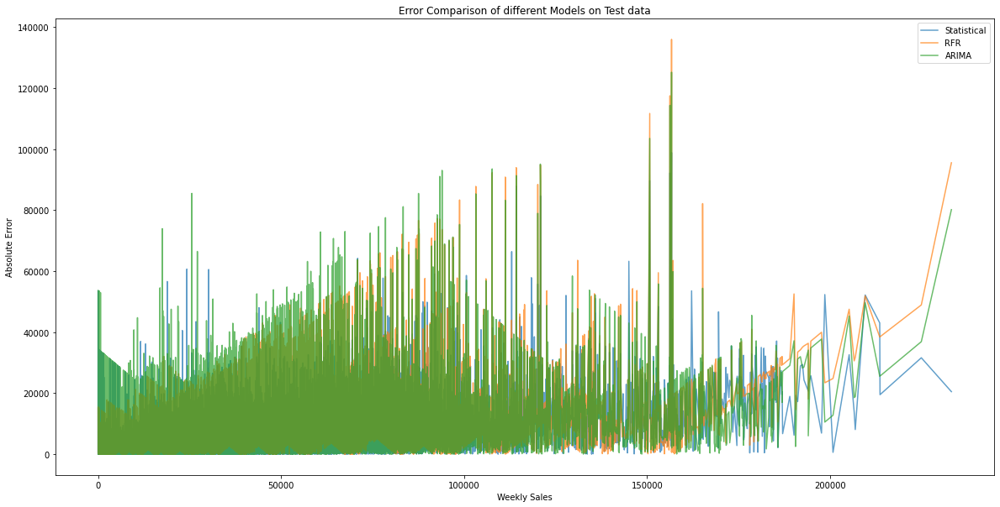

In [102]:
##plotting the absolute error with the weekly sales for all the 3 predictions
temper1 = test_scored_stats.sort_values(by=['Weekly_Sales'])
temper2 = test_rf.sort_values(by=['Weekly_Sales'])
temper3 = fullyscored_test_arima.sort_values(by=['Weekly_Sales'])

plt.figure(figsize=(20,10))
plt.title('Error Comparison of different Models on Test data')
plt.xlabel('Weekly Sales')
plt.ylabel('Absolute Error')
plt.plot(temper1['Weekly_Sales'], temper1['error_abs_st'], label ='Statistical', alpha = 0.7)
plt.plot(temper2['Weekly_Sales'], temper2['error_abs_rf'], label = 'RFR', alpha = 0.7)
plt.plot(temper3['Weekly_Sales'], temper3['error_abs_ar'], label = 'ARIMA', alpha = 0.7)
plt.legend()

**Comments**
- The statistical model is performing best, followed by ARIMA and the Random Forest.
- There is no importance on the macroeconomic indicators like CPI.
- High importance related to seasonal and business metrics and variables.